In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from PFNExperiments.LinearRegression.GenerativeModels.GenerateData import GenerateData, check_data, check_and_plot_data
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_Examples import make_lm_program_trivial_batched, make_lm_program_trivial

from PFNExperiments.LinearRegression.GenerativeModels.GenerateX import simulate_X_uniform
from PFNExperiments.LinearRegression.GenerativeModels.LM_abstract import return_only_y, print_code
from PFNExperiments.LinearRegression.GenerativeModels.Quantizer import Quantizer
from PFNExperiments.LinearRegression.Models.MLP_CNF import MLP_CNF, MLP_CNF_BN
from PFNExperiments.Training.Trainer import Trainer, batch_to_model_lm, visualize_training_results
from PFNExperiments.Training.Losses import MSELoss_unsqueezed, nll_loss_full_gaussian
from PFNExperiments.Training.EvalMetrics import mean_squared_error_torch_avg, mae_torch_avg, r2_score_torch_avg
from PFNExperiments.LinearRegression.Models.ModelPosterior import ModelPosteriorFullGaussian, ModelPosteriorFullGaussian2
from PFNExperiments.LinearRegression.Models.AugmentLoss import add_l2_loss_nll_loss

from PFNExperiments.Training.FlowMatching.CFMLossOT import CFMLossOT

from PFNExperiments.Evaluation.ComparePosteriorSamples import compare_all_metrics, marginal_plots_hist_parallel, marginal_plots_kde_together
from PFNExperiments.LinearRegression.Evaluation.CompareModels import ModelComparison
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF import ModelToPosteriorCNF
from PFNExperiments.LinearRegression.ComparisonModels.Hamiltionion_MC import Hamiltionian_MC

from PFNExperiments.LinearRegression.ComparisonModels.Variational_Inference import Variational_Inference, make_guide_program_gamma_gamma

from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels

from PFNExperiments.LinearRegression.GenerativeModels.Curriculum import Curriculum
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataCurriculumCFM import GenerateDataCurriculumCFM

from PFNExperiments.Training.TrainerCurriculumCNF import TrainerCurriculumCNF

from PFNExperiments.LinearRegression.ComparisonModels.AnalyticalSolutionsLM import PosteriorLM_IG
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_Examples import make_lm_program_ig_batched, make_lm_program_ig
from PFNExperiments.LinearRegression.GenerativeModels.GenerateX import simulate_X_uniform

from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels

c:\Users\arik_\Documents\Dokumente\Job_Clausthal\PFNs\Repository\PFNExperiments\.conda\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
N = 10
P = 4
BATCH_SIZE = 1024
N_EPOCHS = 100
N_SAMPLES_PER_EPOCH = 500_000
N_BATCHES_PER_EPOCH = N_SAMPLES_PER_EPOCH//BATCH_SIZE
SAVE_PATH = "Training/FlowMatching/SaveFolderTesting"

#BATCH_SIZE = 128

In [4]:
mu = 1.0
sigma = 2.0

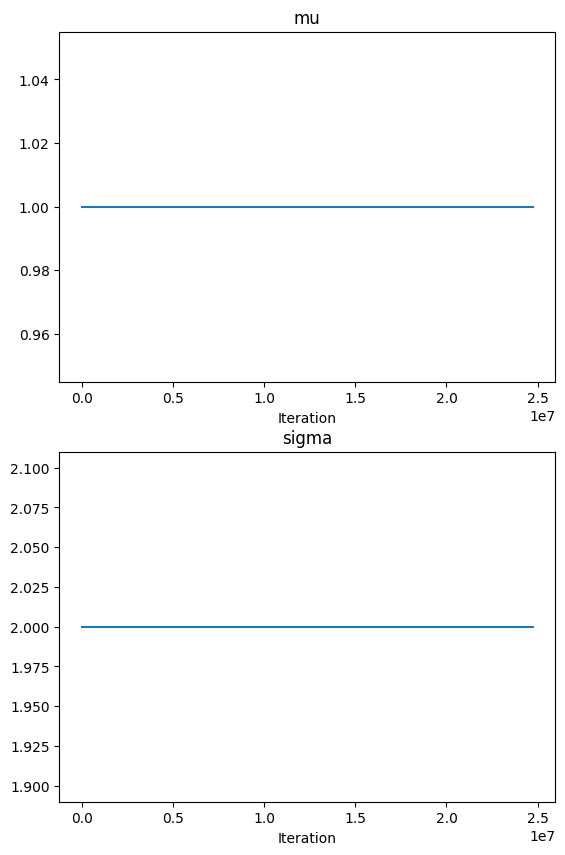

In [5]:
curriculum = Curriculum(max_iter=int(N_EPOCHS*N_BATCHES_PER_EPOCH*BATCH_SIZE*0.5))
curriculum.add_param_list(
    [
    ("mu", curriculum.constant_scheduler(mu)),
    ("sigma", curriculum.constant_scheduler(sigma)),
    ]
)
curriculum.plot_all_schedules()

In [6]:
curriculum.get_params(299*N_SAMPLES_PER_EPOCH)

{'mu': 1.0, 'sigma': 2.0}

In [7]:
data_generator = GenerateDataCurriculumCFM(
    pprogram_maker= make_lm_program_trivial_batched,
    curriculum= curriculum,
)

In [8]:
next(iter(data_generator.make_dataloaders_for_epoch_dynamic()[0])).keys()

dict_keys(['x', 'y', 'beta', 'time', 'base_sample_beta'])

####################################################################################################
Epoch 0


100%|██████████| 10/10 [00:00<00:00, 63.83it/s]


{'X': {'mean': tensor(0.4999), 'variance': tensor(0.0833), 'min': tensor(2.3842e-07), 'max': tensor(1.0000)}, 'y': {'mean': tensor(1.), 'variance': tensor(0.), 'min': tensor(1.), 'max': tensor(1.)}, 'beta': {'mean': tensor([0.9830, 1.0081, 0.9851, 1.0427, 0.9853]), 'variance': tensor([4.1429, 3.9713, 4.1397, 3.8933, 3.8691]), 'min': tensor([-5.6601, -5.0470, -5.1044, -6.5820, -4.9499]), 'max': tensor([ 7.9887,  7.1967,  7.3939, 10.3648,  7.8850])}}
Statistics for time:
Mean: 0.5042556411586702
Variance: 0.08418284730871396
Min: 4.988908767700195e-05
Max: 0.9987354874610901


Statistics for base_sample_beta:
Mean: tensor([ 0.0134,  0.0270,  0.0143, -0.0082, -0.0014])
Variance: tensor([0.9774, 0.9919, 1.0125, 0.9992, 1.0494])
Min: tensor([-3.2877, -3.4270, -3.5100, -3.2270, -3.7818])
Max: tensor([3.0232, 3.4137, 3.1975, 3.6827, 3.2494])




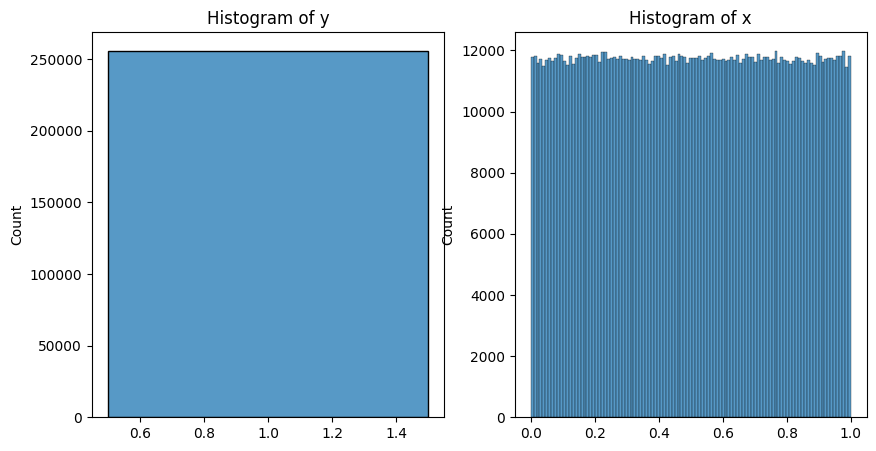

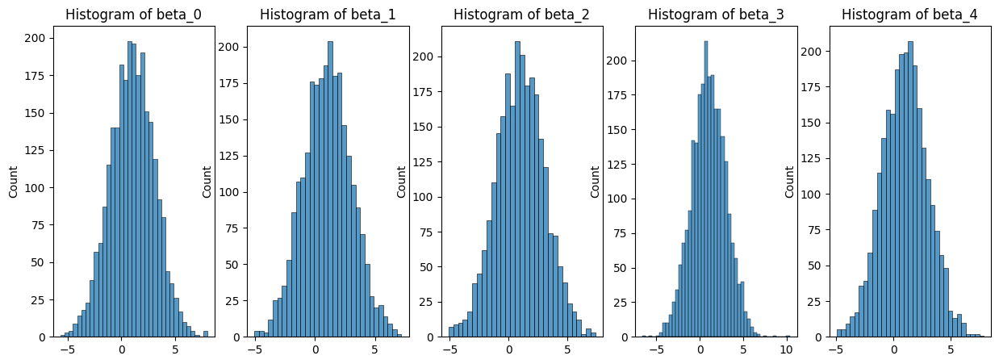

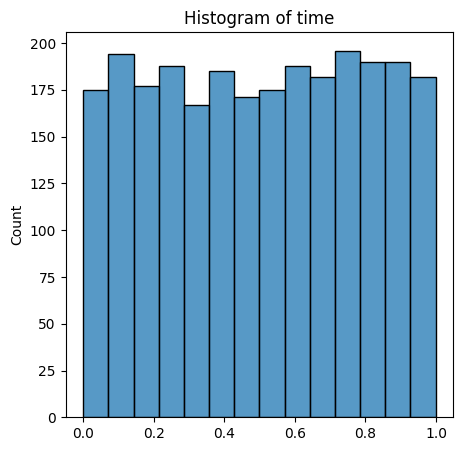

tensor([ 1.7952,  1.8440, -0.1049,  ...,  0.0492,  0.2359,  0.0842])
tensor([ 0.9921, -0.8346,  1.2452,  ...,  0.3610, -0.2870, -0.0426])
tensor([-1.3031, -1.3823,  0.6870,  ..., -2.3788, -1.1897,  0.0885])
tensor([ 0.4679, -0.1973, -1.0191,  ..., -2.3872,  0.0686, -1.2176])
tensor([1.0003, 0.7652, 0.2525,  ..., 0.5956, 1.2096, 0.1212])


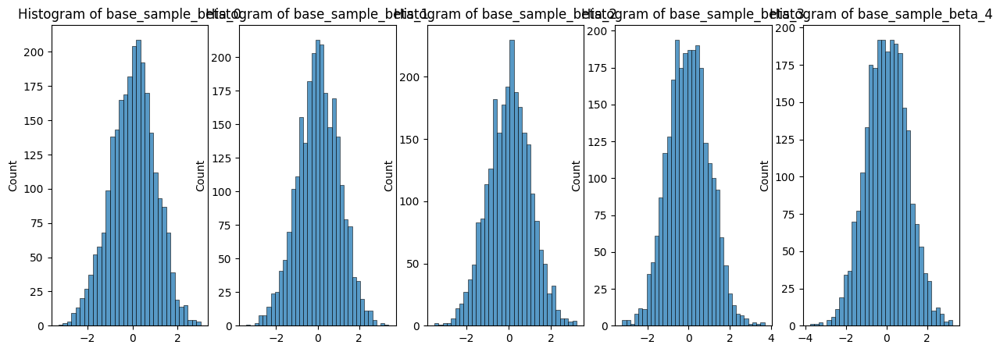

####################################################################################################
Epoch 99


100%|██████████| 10/10 [00:00<00:00, 56.39it/s]


{'X': {'mean': tensor(0.5000), 'variance': tensor(0.0833), 'min': tensor(1.1325e-06), 'max': tensor(1.0000)}, 'y': {'mean': tensor(1.), 'variance': tensor(0.), 'min': tensor(1.), 'max': tensor(1.)}, 'beta': {'mean': tensor([0.9793, 0.9582, 1.0054, 1.0642, 1.0222]), 'variance': tensor([3.9469, 3.9590, 4.0362, 3.9111, 4.0852]), 'min': tensor([-6.5202, -5.1794, -5.2843, -6.8684, -5.6553]), 'max': tensor([8.9855, 6.9171, 7.4491, 8.5048, 7.7881])}}
Statistics for time:
Mean: 0.4996496226172894
Variance: 0.08538006848072338
Min: 0.0002817511558532715
Max: 0.9997938871383667


Statistics for base_sample_beta:
Mean: tensor([ 0.0055, -0.0172,  0.0060, -0.0307,  0.0197])
Variance: tensor([0.9942, 0.9656, 0.9858, 1.0510, 0.9983])
Min: tensor([-3.4703, -3.5624, -3.0353, -3.3824, -3.4352])
Max: tensor([2.9490, 3.4062, 4.0999, 4.1074, 3.0484])




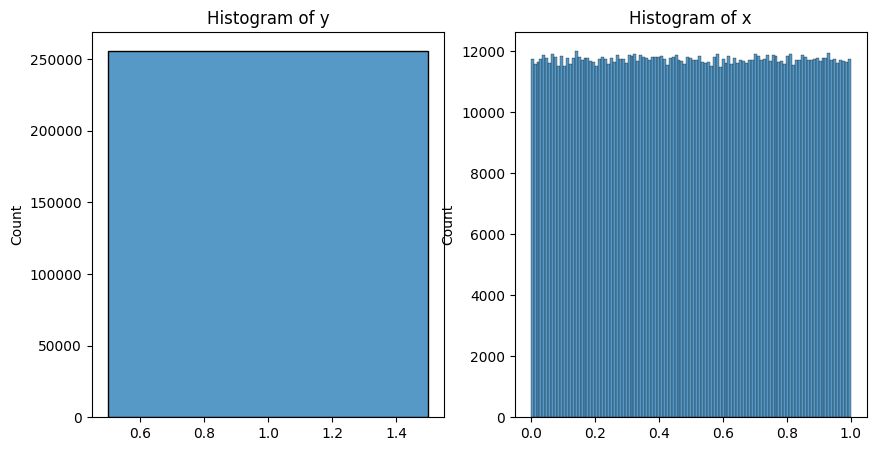

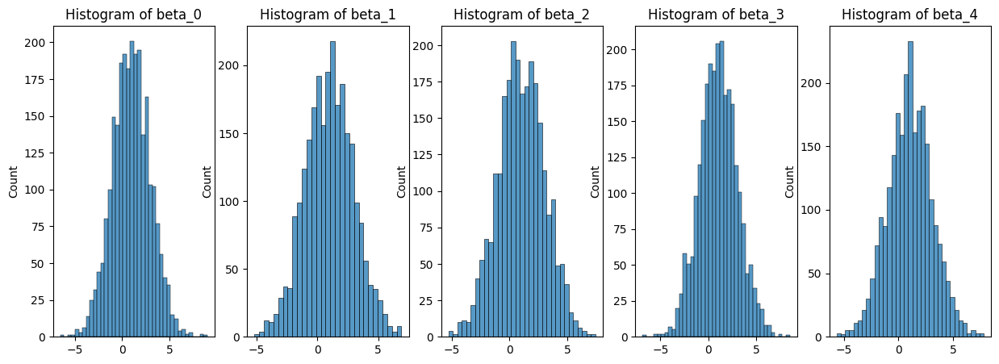

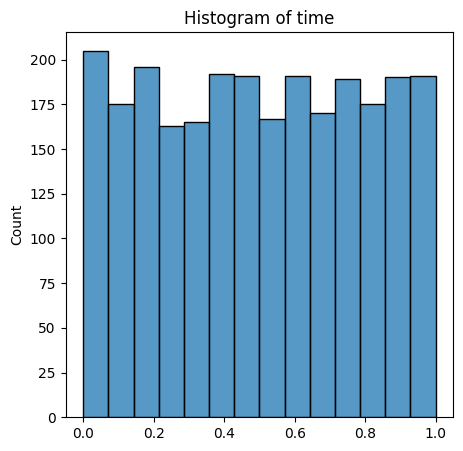

tensor([-1.8526, -0.0211,  0.0027,  ...,  0.4851, -1.0447, -0.0375])
tensor([ 1.9852,  0.0259, -0.9914,  ..., -0.4881, -0.3954,  1.0428])
tensor([ 0.8424,  0.6719, -0.7561,  ...,  1.2802,  0.7811,  0.2712])
tensor([ 0.3794,  0.6443, -2.5287,  ..., -0.0452, -1.1617,  0.3767])
tensor([ 1.9738,  2.6985, -0.0323,  ...,  1.8588, -0.8039, -0.7067])


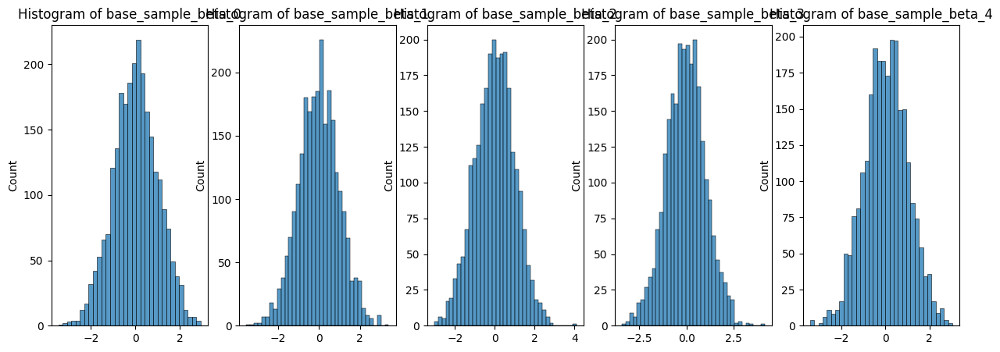

[{'X': {'mean': tensor(0.4999),
   'variance': tensor(0.0833),
   'min': tensor(2.3842e-07),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(1.),
   'variance': tensor(0.),
   'min': tensor(1.),
   'max': tensor(1.)},
  'beta': {'mean': tensor([0.9830, 1.0081, 0.9851, 1.0427, 0.9853]),
   'variance': tensor([4.1429, 3.9713, 4.1397, 3.8933, 3.8691]),
   'min': tensor([-5.6601, -5.0470, -5.1044, -6.5820, -4.9499]),
   'max': tensor([ 7.9887,  7.1967,  7.3939, 10.3648,  7.8850])}},
 {'X': {'mean': tensor(0.5000),
   'variance': tensor(0.0833),
   'min': tensor(1.1325e-06),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(1.),
   'variance': tensor(0.),
   'min': tensor(1.),
   'max': tensor(1.)},
  'beta': {'mean': tensor([0.9793, 0.9582, 1.0054, 1.0642, 1.0222]),
   'variance': tensor([3.9469, 3.9590, 4.0362, 3.9111, 4.0852]),
   'min': tensor([-6.5202, -5.1794, -5.2843, -6.8684, -5.6553]),
   'max': tensor([8.9855, 6.9171, 7.4491, 8.5048, 7.7881])}}]

In [9]:
data_generator.check_model(
    n_samples_per_epoch=N_SAMPLES_PER_EPOCH,
    epochs_to_check = [0, N_EPOCHS-1],
    p = 5,
    used_batch_samples = 10
)

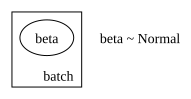

In [10]:
data_generator.render_model()

In [11]:
epoch_loader = data_generator.make_epoch_loader(
    n = N,
    p = P,
    number_of_batches_per_epoch = N_BATCHES_PER_EPOCH,
    n_epochs = N_EPOCHS,
    batch_size= BATCH_SIZE,
    train_frac= 0.5,
    val_frac= 0.1,
    shuffle=False,
    n_samples_to_generate_at_once = 250_000
)

The number of batches times the number of epochs must be equal to the total number of iterations in the curriculum. But got 49971200 and 24985600 respectively


In [12]:
sample_batch = next(iter(epoch_loader[0][0]))

In [13]:
sample_batch.keys()

dict_keys(['x', 'y', 'beta', 'time', 'base_sample_beta'])

In [14]:
"""
model = Transformer(
    n_features= P+1,
    seq_len= N,
    d_model= 1024,
    n_heads=4,
    dim_feedforward=512,
    n_layers=4,
    n_skip_layers_final_heads = 3,
    n_output_units_per_head=[5]
).cuda()
"""

model = MLP_CNF_BN(
    n_data_inputs= (P+1)*N,
    n_parameter_inputs = P,
    layers = [
        32,
        64,
        64,
        32
    ],
    n_time_embedding = 32,
)

In [15]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [16]:
'{:.2e}'.format(count_parameters(model))

'2.14e+04'

In [17]:
import torch
from torch.optim.lr_scheduler import ReduceLROnPlateau, OneCycleLR

In [18]:
lr = 1e-4
opt = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)

In [26]:
loss_fun = CFMLossOT(
    sigma_min=1e-3
)

In [27]:
scheduler = OneCycleLR(opt,
                       max_lr = 1e-4,
                       epochs = N_EPOCHS,
                       steps_per_epoch = N_SAMPLES_PER_EPOCH//BATCH_SIZE,
                       pct_start = 0.1,
                       div_factor=25.0,
                       final_div_factor=1e2)

scheduler = ReduceLROnPlateau(opt)

additional_evals = {
}

In [28]:
trainer = TrainerCurriculumCNF(
    model = model,
    optimizer=opt,
    scheduler = None,
    loss_function=loss_fun,
    epoch_loader = epoch_loader,
    evaluation_functions= additional_evals,
    n_epochs = N_EPOCHS,
    early_stopping_patience = 200,
    schedule_step_on = "batch",
    save_path = SAVE_PATH,
    use_same_timestep_per_batch = False,
)

In [29]:
trainer.save_path

'Training/FlowMatching/SaveFolderTesting/experiment_2024_06_11_13_34_18'

In [30]:
trainer.validate()

100%|██████████| 49/49 [00:03<00:00, 14.14it/s]


{'loss': 30216.826171875,
 'median_loss': 29.4964599609375,
 'std_loss': 209606.71875}

In [31]:
%load_ext tensorboard
%tensorboard --logdir /content/runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 21176), started 20:11:50 ago. (Use '!kill 21176' to kill it.)

In [32]:
r = trainer.train()

Curriculum parameters: {'mu': 1.0, 'sigma': 2.0} at iteration 0


  0%|          | 0/244 [00:00<?, ?it/s]

100%|██████████| 49/49 [00:03<00:00, 14.93it/s]


Epoch 0:
Training: {'loss': 840.1354370117188, 'median_loss': 21.899066925048828, 'std_loss': 4967.6748046875}
Validation: {'loss': 1032.6754150390625, 'median_loss': 23.084102630615234, 'std_loss': 4059.97998046875}
Validation curriculum: {'loss': 4293.23193359375, 'median_loss': 26.368755340576172, 'std_loss': 25168.880859375}
Time: 25.62574791908264


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'mu': 1.0, 'sigma': 2.0} at iteration 249856


100%|██████████| 49/49 [00:02<00:00, 19.80it/s]


Epoch 1:
Training: {'loss': 8448.6015625, 'median_loss': 31.42939567565918, 'std_loss': 120490.1015625}
Validation: {'loss': 33298.72265625, 'median_loss': 27.70017433166504, 'std_loss': 219592.640625}
Validation curriculum: {'loss': 20788.6484375, 'median_loss': 20.644363403320312, 'std_loss': 120006.2890625}
Time: 21.08147168159485


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'mu': 1.0, 'sigma': 2.0} at iteration 499712


100%|██████████| 49/49 [00:02<00:00, 20.43it/s]


Epoch 2:
Training: {'loss': 8033.84375, 'median_loss': 32.336917877197266, 'std_loss': 118624.9375}
Validation: {'loss': 384.01446533203125, 'median_loss': 23.263553619384766, 'std_loss': 1266.17626953125}
Validation curriculum: {'loss': 7304.1484375, 'median_loss': 26.387451171875, 'std_loss': 47621.26171875}
Time: 19.074464559555054


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'mu': 1.0, 'sigma': 2.0} at iteration 749568


100%|██████████| 49/49 [00:02<00:00, 19.60it/s]


Epoch 3:
Training: {'loss': 20371.033203125, 'median_loss': 23.813806533813477, 'std_loss': 263002.625}
Validation: {'loss': 4542.7861328125, 'median_loss': 25.207223892211914, 'std_loss': 27619.234375}
Validation curriculum: {'loss': 140.08953857421875, 'median_loss': 17.237815856933594, 'std_loss': 469.2597961425781}
Time: 19.145258903503418


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'mu': 1.0, 'sigma': 2.0} at iteration 999424


100%|██████████| 49/49 [00:02<00:00, 19.15it/s]


Epoch 4:
Training: {'loss': 4371.6005859375, 'median_loss': 24.333011627197266, 'std_loss': 34130.48046875}
Validation: {'loss': 86.80872344970703, 'median_loss': 17.56707000732422, 'std_loss': 222.8942108154297}
Validation curriculum: {'loss': 106.68850708007812, 'median_loss': 30.762100219726562, 'std_loss': 223.59498596191406}
Time: 19.039630651474


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'mu': 1.0, 'sigma': 2.0} at iteration 1249280


100%|██████████| 49/49 [00:02<00:00, 20.97it/s]


Epoch 5:
Training: {'loss': 9712.4169921875, 'median_loss': 21.8612117767334, 'std_loss': 93023.46875}
Validation: {'loss': 176.3699188232422, 'median_loss': 16.914234161376953, 'std_loss': 630.7307739257812}
Validation curriculum: {'loss': 58044.5, 'median_loss': 15.418549537658691, 'std_loss': 392370.3125}
Time: 18.855828762054443


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'mu': 1.0, 'sigma': 2.0} at iteration 1499136


100%|██████████| 49/49 [00:02<00:00, 18.35it/s]


Epoch 6:
Training: {'loss': 8666.931640625, 'median_loss': 29.487728118896484, 'std_loss': 118999.203125}
Validation: {'loss': 37039.5546875, 'median_loss': 16.069904327392578, 'std_loss': 254326.75}
Validation curriculum: {'loss': 173.61019897460938, 'median_loss': 40.22502517700195, 'std_loss': 437.8595275878906}
Time: 19.643316984176636


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'mu': 1.0, 'sigma': 2.0} at iteration 1748992


100%|██████████| 49/49 [00:02<00:00, 17.38it/s]


Epoch 7:
Training: {'loss': 8859.888671875, 'median_loss': 23.218387603759766, 'std_loss': 123303.5859375}
Validation: {'loss': 30963.078125, 'median_loss': 19.707069396972656, 'std_loss': 199776.609375}
Validation curriculum: {'loss': 835.6703491210938, 'median_loss': 27.557085037231445, 'std_loss': 4519.35498046875}
Time: 21.44264316558838


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'mu': 1.0, 'sigma': 2.0} at iteration 1998848


100%|██████████| 49/49 [00:02<00:00, 19.95it/s]


Epoch 8:
Training: {'loss': 9999.919921875, 'median_loss': 22.909875869750977, 'std_loss': 88611.953125}
Validation: {'loss': 3018.10693359375, 'median_loss': 17.99361801147461, 'std_loss': 10212.8916015625}
Validation curriculum: {'loss': 372.62939453125, 'median_loss': 19.546430587768555, 'std_loss': 1231.5687255859375}
Time: 23.958194971084595


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'mu': 1.0, 'sigma': 2.0} at iteration 2248704


100%|██████████| 49/49 [00:02<00:00, 20.63it/s]


Epoch 9:
Training: {'loss': 1007.1031494140625, 'median_loss': 19.95391082763672, 'std_loss': 9185.3798828125}
Validation: {'loss': 167.69140625, 'median_loss': 33.706443786621094, 'std_loss': 393.51788330078125}
Validation curriculum: {'loss': 107.66273498535156, 'median_loss': 22.10988426208496, 'std_loss': 267.1209411621094}
Time: 19.731796979904175


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'mu': 1.0, 'sigma': 2.0} at iteration 2498560


100%|██████████| 49/49 [00:02<00:00, 22.81it/s]


Epoch 10:
Training: {'loss': 3354.42822265625, 'median_loss': 25.07459259033203, 'std_loss': 32533.615234375}
Validation: {'loss': 2310.7333984375, 'median_loss': 26.70513153076172, 'std_loss': 7499.23779296875}
Validation curriculum: {'loss': 833.4828491210938, 'median_loss': 36.269813537597656, 'std_loss': 2586.197509765625}
Time: 18.501413583755493


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'mu': 1.0, 'sigma': 2.0} at iteration 2748416


100%|██████████| 49/49 [00:02<00:00, 21.15it/s]


Epoch 11:
Training: {'loss': 12361.6904296875, 'median_loss': 23.85477638244629, 'std_loss': 118953.53125}
Validation: {'loss': 581.7764892578125, 'median_loss': 29.110851287841797, 'std_loss': 2444.10205078125}
Validation curriculum: {'loss': 3038.380126953125, 'median_loss': 21.770153045654297, 'std_loss': 14809.16796875}
Time: 18.770078420639038


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'mu': 1.0, 'sigma': 2.0} at iteration 2998272


100%|██████████| 49/49 [00:02<00:00, 19.52it/s]


Epoch 12:
Training: {'loss': 3580.603515625, 'median_loss': 24.084640502929688, 'std_loss': 42062.3828125}
Validation: {'loss': 1251.43505859375, 'median_loss': 22.457990646362305, 'std_loss': 5481.919921875}
Validation curriculum: {'loss': 137.89337158203125, 'median_loss': 19.949960708618164, 'std_loss': 497.1776123046875}
Time: 19.64235758781433


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'mu': 1.0, 'sigma': 2.0} at iteration 3248128


 90%|████████▉ | 219/244 [00:14<00:01, 15.71it/s]

In [ ]:
visualize_training_results(r, loglog = False)

NameError: name 'r' is not defined

In [ ]:
trainer.load_best_model()

In [ ]:
model = trainer.model

In [ ]:
model.eval()

MLP_CNF_BN(
  (time_embedding): Linear(in_features=1, out_features=32, bias=True)
  (layers): ModuleList(
    (0): Linear(in_features=4, out_features=32, bias=True)
    (1): Linear(in_features=32, out_features=64, bias=True)
    (2): Linear(in_features=64, out_features=64, bias=True)
    (3): Linear(in_features=64, out_features=32, bias=True)
  )
  (batch_norms): ModuleList(
    (0): ConditionalBatchNorm(
      (bn): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=True)
      (linear_gamma): Linear(in_features=32, out_features=32, bias=True)
      (linear_beta): Linear(in_features=32, out_features=32, bias=True)
    )
    (1-2): 2 x ConditionalBatchNorm(
      (bn): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=True)
      (linear_gamma): Linear(in_features=32, out_features=64, bias=True)
      (linear_beta): Linear(in_features=32, out_features=64, bias=True)
    )
    (3): ConditionalBatchNorm(
      (bn): BatchNorm1d(32, eps=1e-

In [ ]:
trainer.load_best_model()

In [ ]:
trainer.test()

100%|██████████| 196/196 [00:11<00:00, 16.45it/s]


{'loss': 2.543715715408325,
 'median_loss': 2.5419251918792725,
 'std_loss': 0.0703008845448494}

In [ ]:
full_model = ModelToPosteriorCNF(
    model = model,
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=10_000
)

In [ ]:
sample = full_model.sample_posterior_x(x = sample_batch["x"], n_samples=100)

In [ ]:
sample.shape

torch.Size([100, 4])

In [ ]:
benchmark_params_ppgrogram = data_generator.curriculum.get_params(-1)
print(f"params for pprogram: {benchmark_params_ppgrogram}")

pprogram1 = make_lm_program_trivial(**benchmark_params_ppgrogram)

pprogram1_y = return_only_y(pprogram1)
print_code(pprogram1)

params for pprogram: {'mu': 1.0, 'sigma': 2.0}
        def multivariate_lm_return_dict(x: torch.Tensor, y: torch.Tensor = None) -> dict:
                # Define distributions for the global parameters
                beta = pyro.sample("beta", dist.Normal(mu, sigma).expand([x.shape[1]]).to_event(1) )  # the parameters of the linear model

                y = torch.ones(x.shape[0])  # the response variable

                return {
                        "x": x,
                        "y": y,
                        "beta": beta
                }



In [ ]:
test_loader = trainer.testset

In [ ]:
test_batch = next(iter(test_loader))

In [ ]:
test_batch["beta"][:5]

tensor([[ 1.9205, -0.0300,  3.6775, -3.7061],
        [ 1.7539,  1.6383, -1.4682,  0.6432],
        [ 5.5044,  1.1865,  3.4626,  3.4389],
        [ 2.3108,  2.3800,  0.9157,  0.6632],
        [ 5.4448,  2.3097,  1.3805,  3.7192]])

In [ ]:
hmc_sampler = Hamiltionian_MC(pprogram = pprogram1_y, n_warmup=500, n_samples=500)

comparison_model_hmc =  CompareComparisonModels(
    comparison_model_1=full_model,
    comparison_model_2=hmc_sampler,
    n_samples_comparison_model_1=10_000,
    save_path = trainer.save_path
)


Sample: 100%|██████████| 1000/1000 [00:06, 155.26it/s, step size=7.67e-01, acc. prob=0.907]



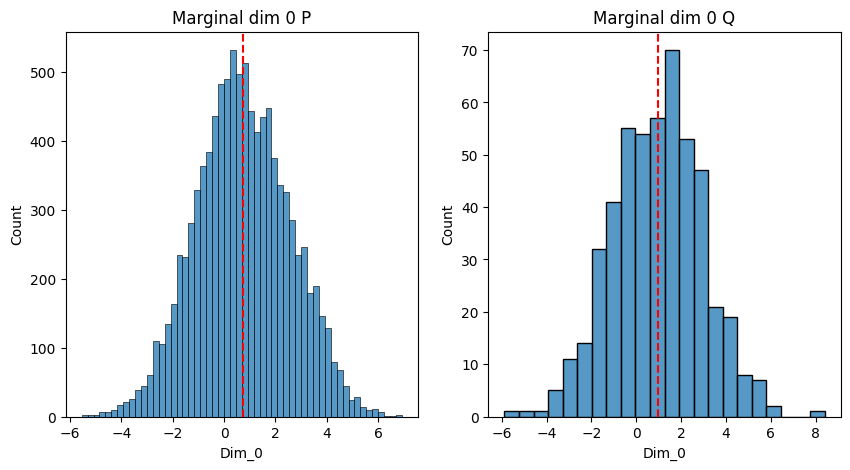

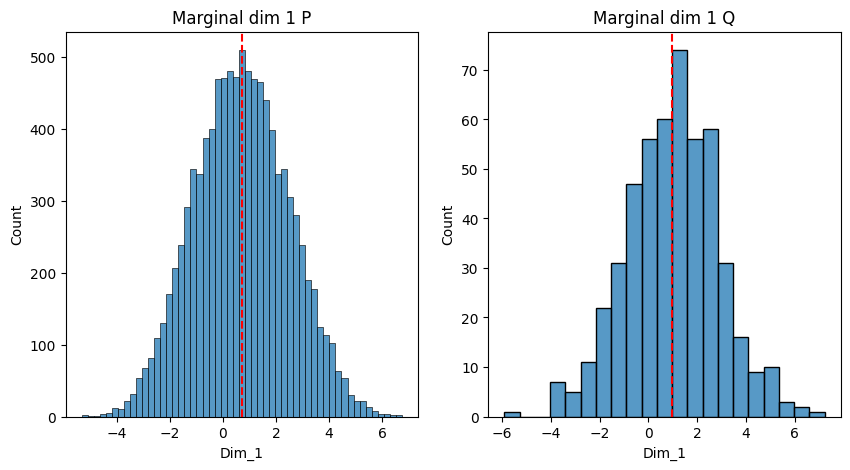

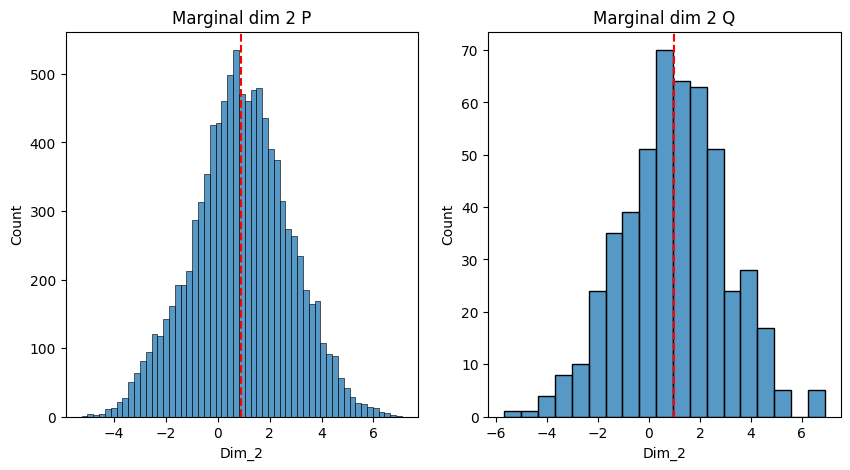

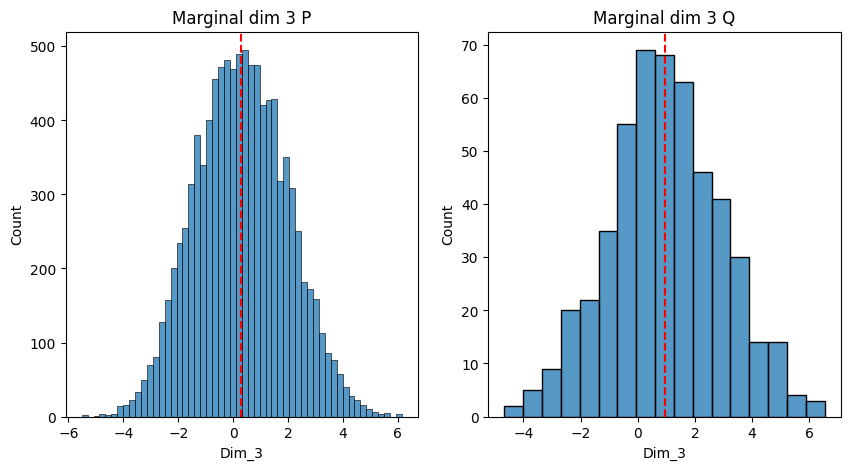

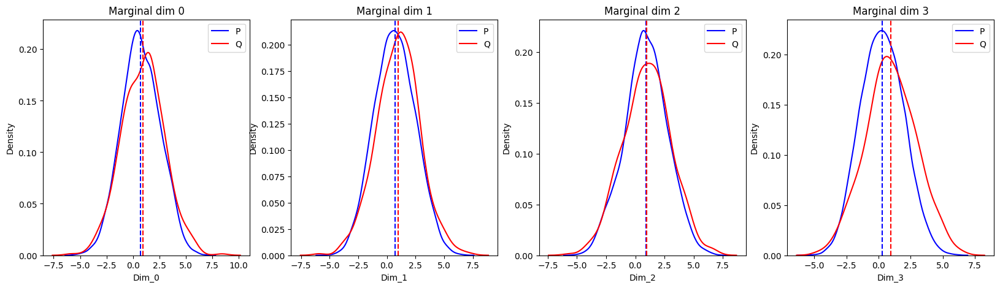

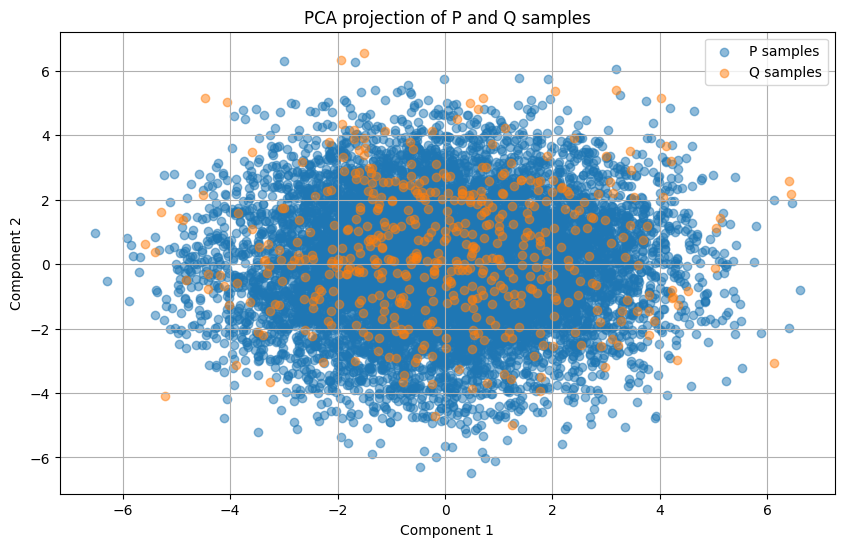

c:\Users\arik_\Documents\Dokumente\Job_Clausthal\PFNs\Repository\PFNExperiments\.conda\lib\site-packages\ot\lp\__init__.py:571: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  check_result(result_code)
Sample: 100%|██████████| 1000/1000 [00:08, 112.79it/s, step size=8.47e-01, acc. prob=0.874]



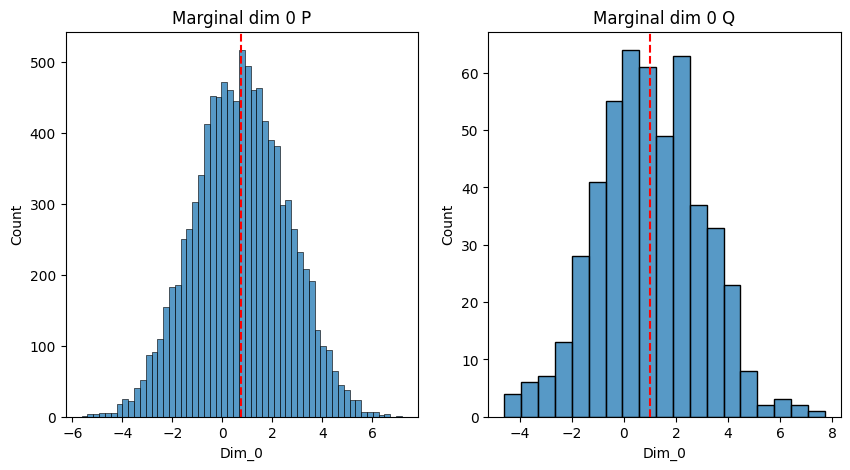

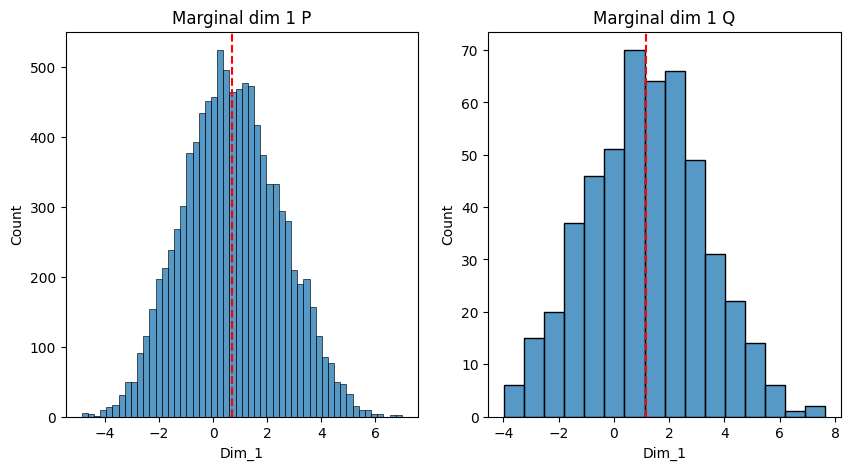

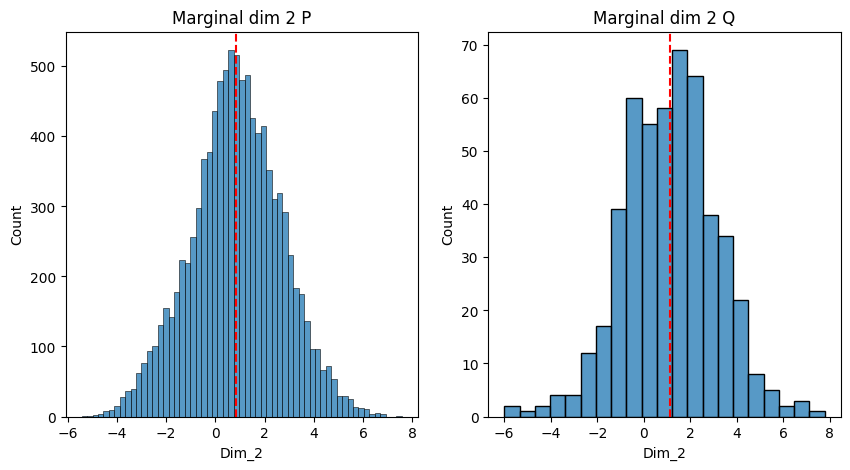

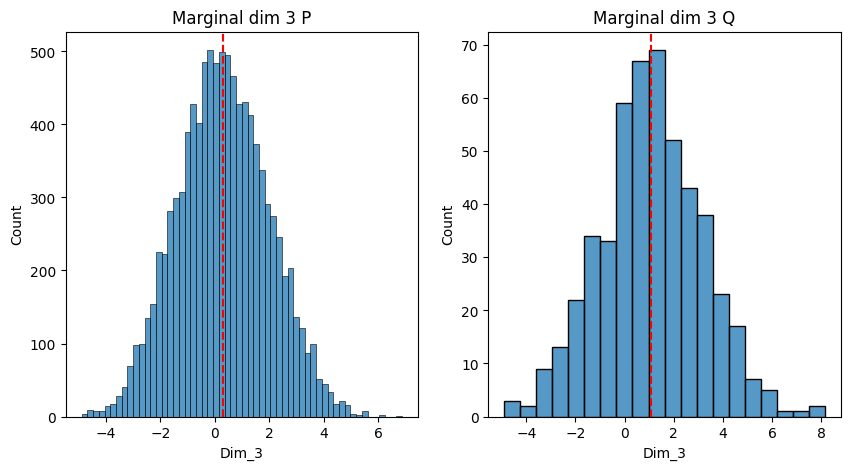

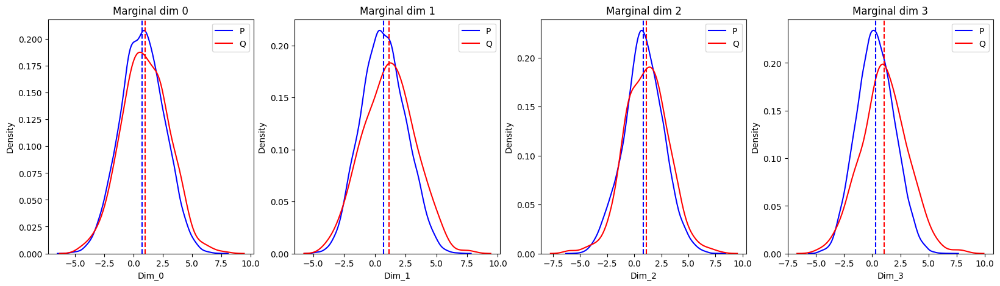

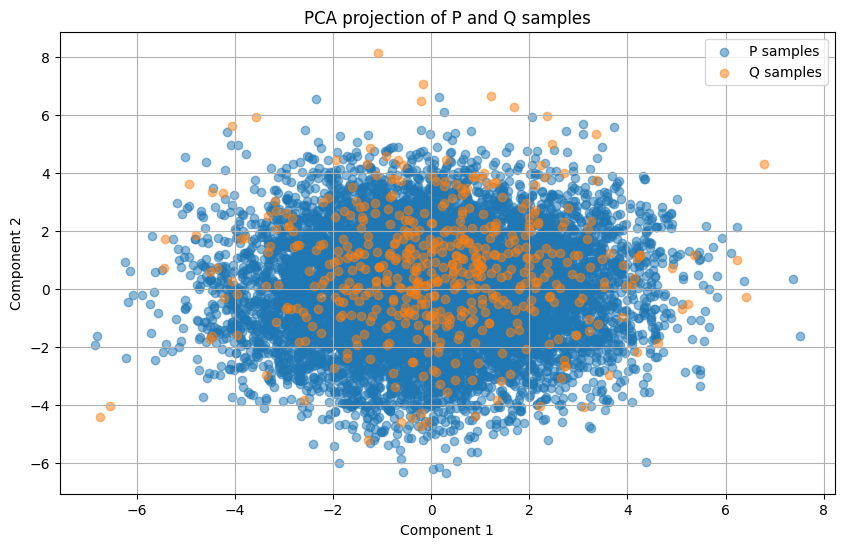

c:\Users\arik_\Documents\Dokumente\Job_Clausthal\PFNs\Repository\PFNExperiments\.conda\lib\site-packages\ot\lp\__init__.py:571: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  check_result(result_code)
Sample: 100%|██████████| 1000/1000 [00:05, 181.53it/s, step size=8.36e-01, acc. prob=0.893]



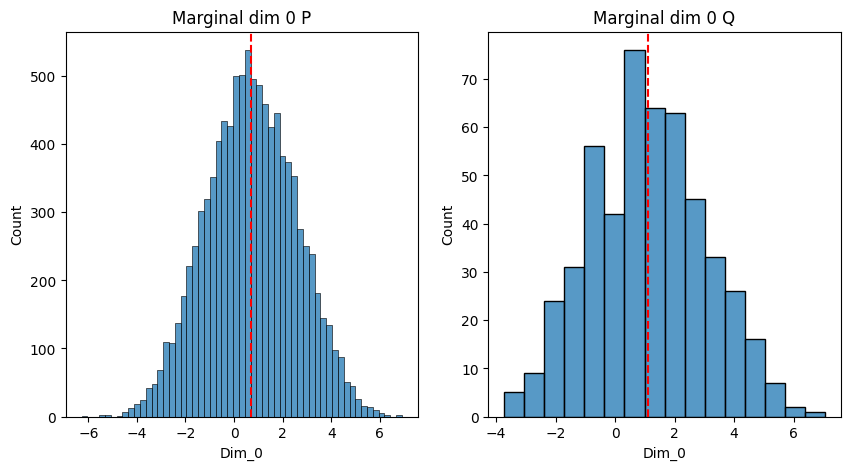

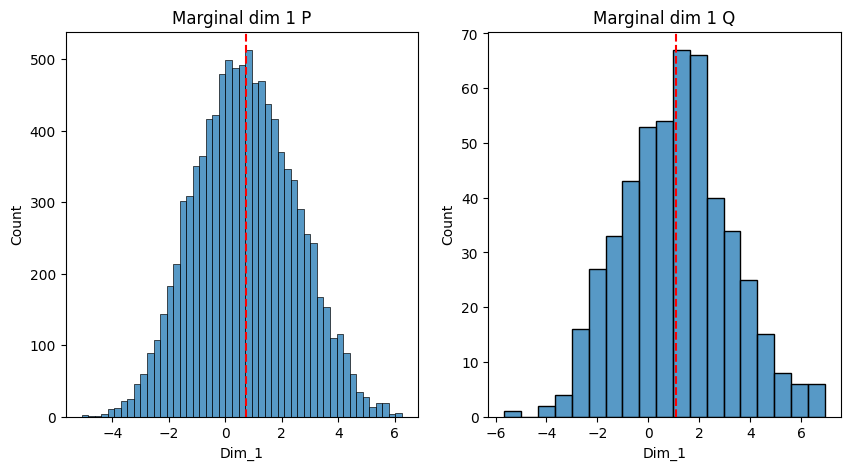

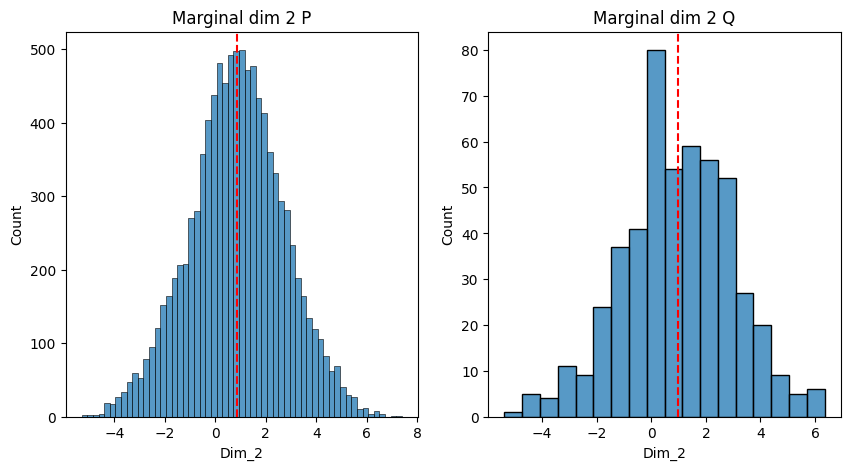

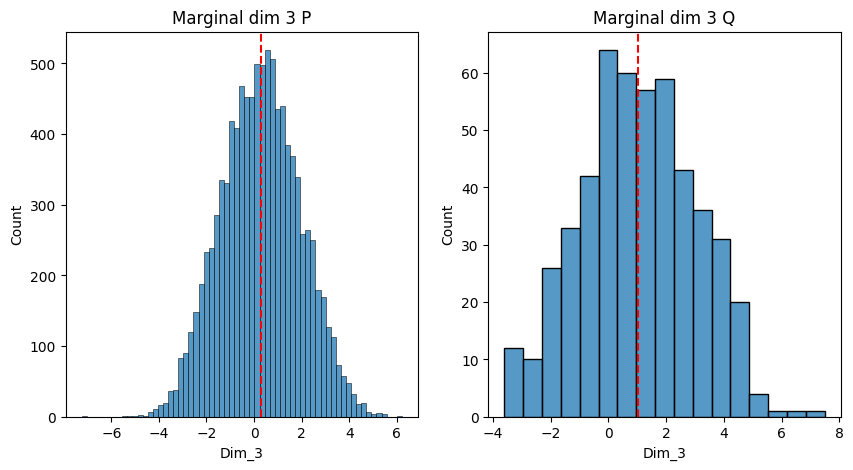

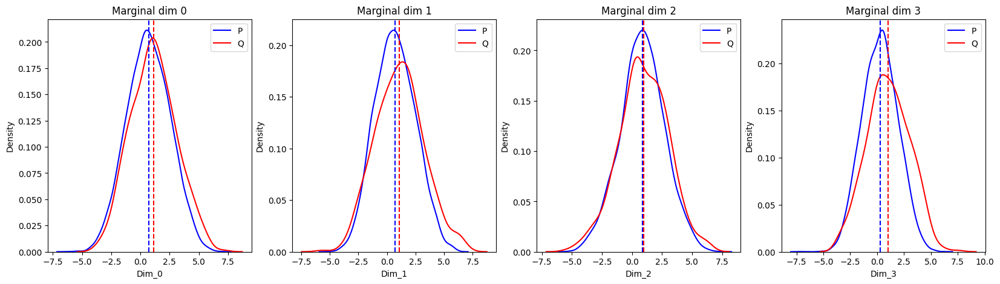

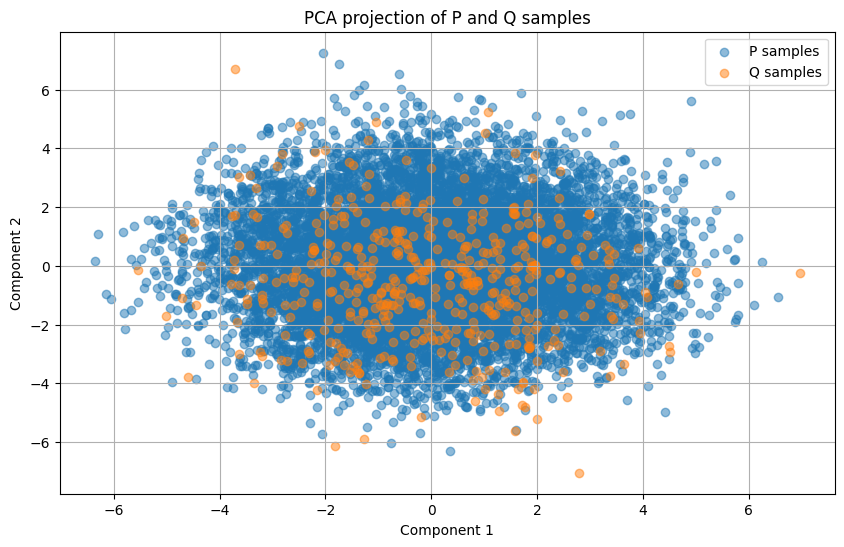

c:\Users\arik_\Documents\Dokumente\Job_Clausthal\PFNs\Repository\PFNExperiments\.conda\lib\site-packages\ot\lp\__init__.py:571: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  check_result(result_code)
Sample: 100%|██████████| 1000/1000 [00:06, 157.53it/s, step size=6.43e-01, acc. prob=0.932]



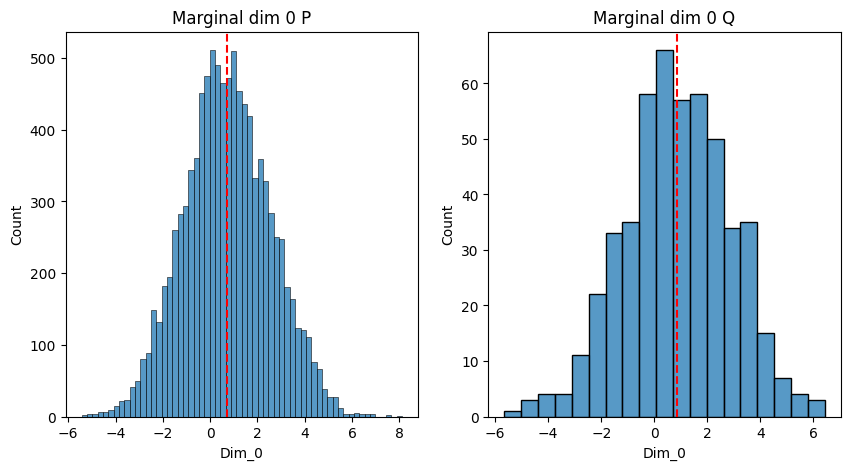

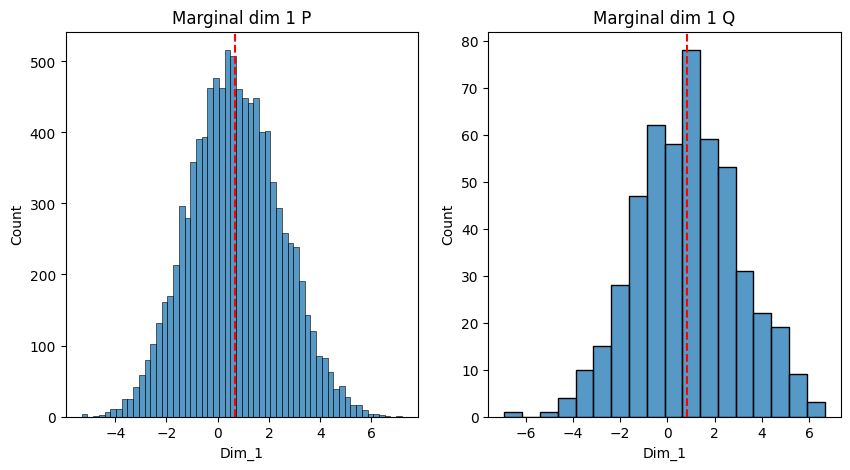

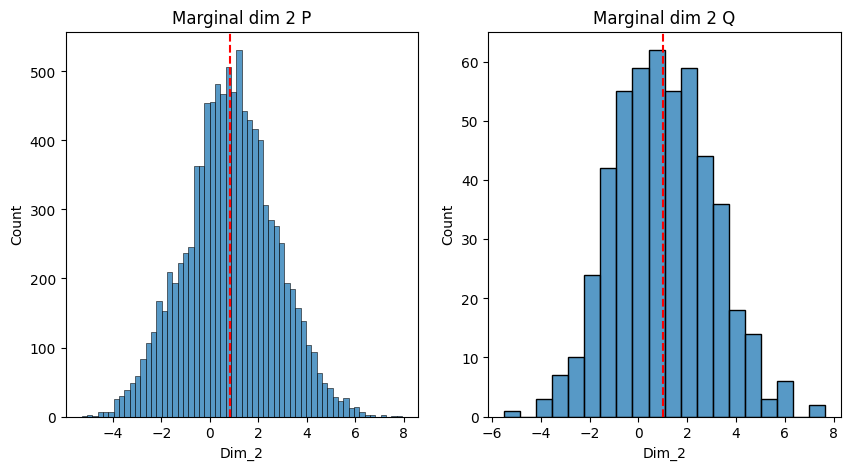

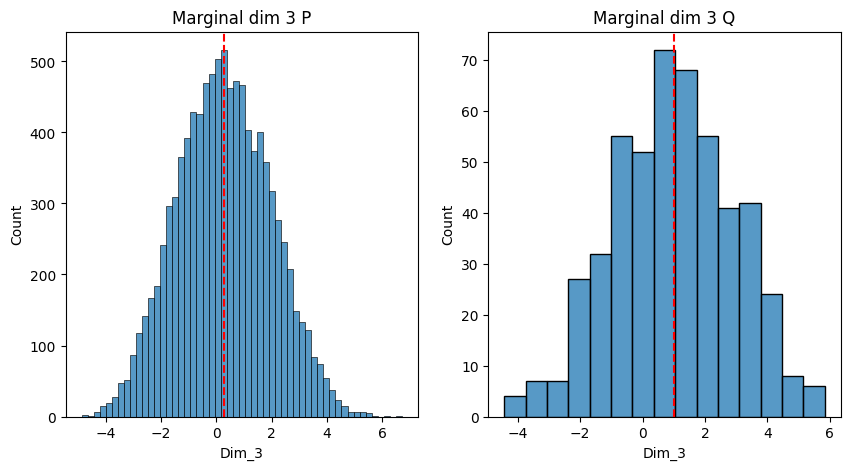

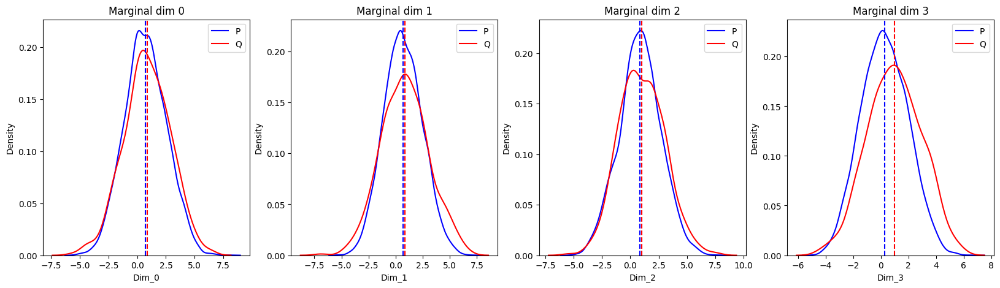

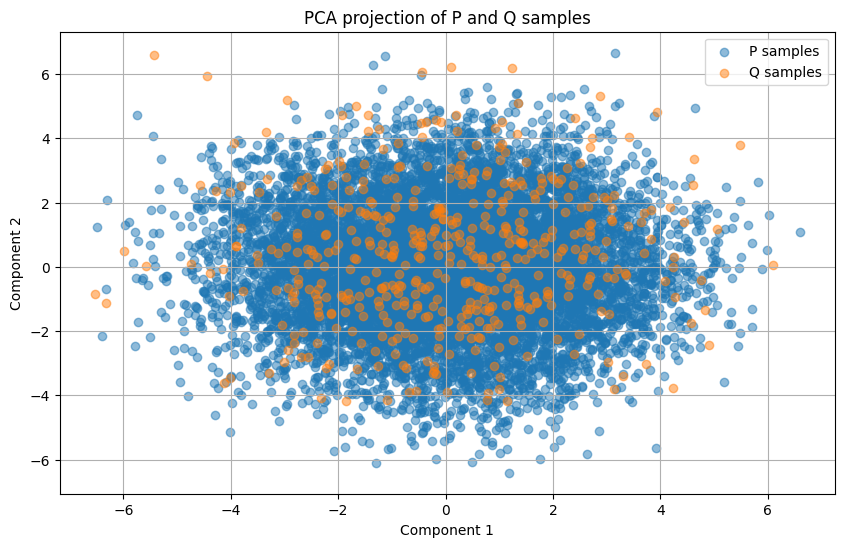

c:\Users\arik_\Documents\Dokumente\Job_Clausthal\PFNs\Repository\PFNExperiments\.conda\lib\site-packages\ot\lp\__init__.py:571: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  check_result(result_code)
Sample: 100%|██████████| 1000/1000 [00:07, 135.58it/s, step size=9.25e-01, acc. prob=0.887]



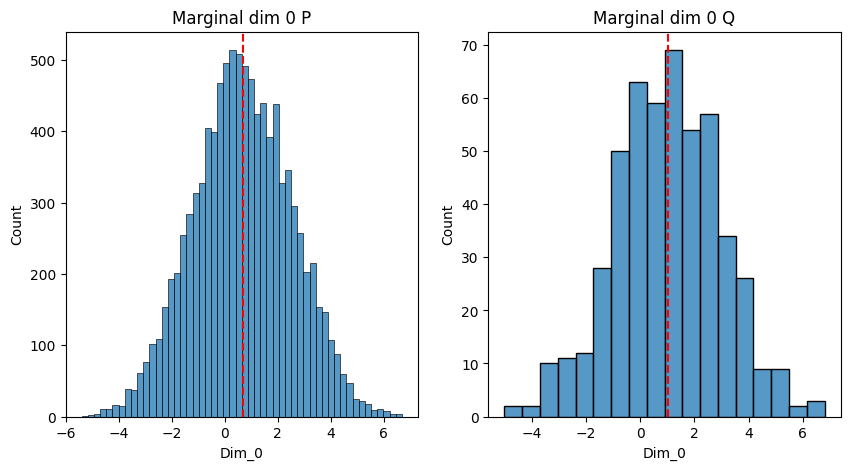

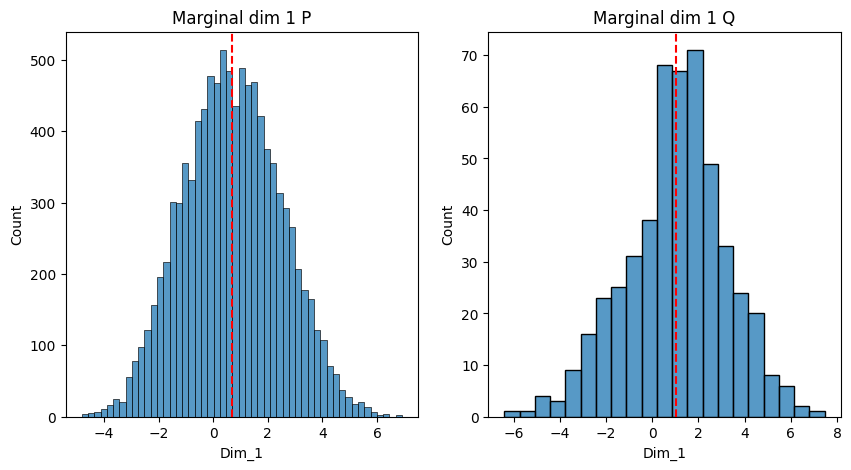

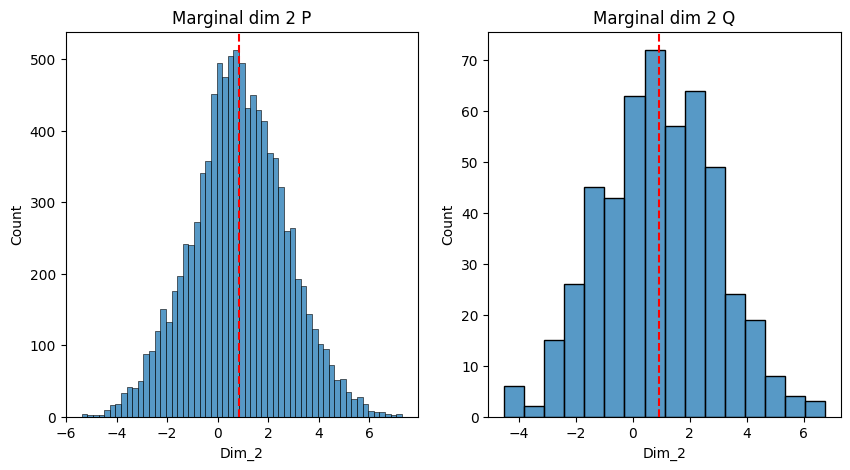

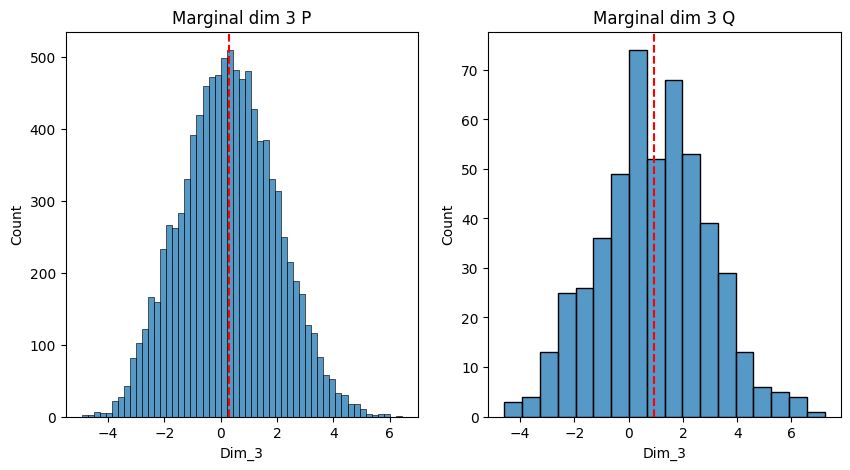

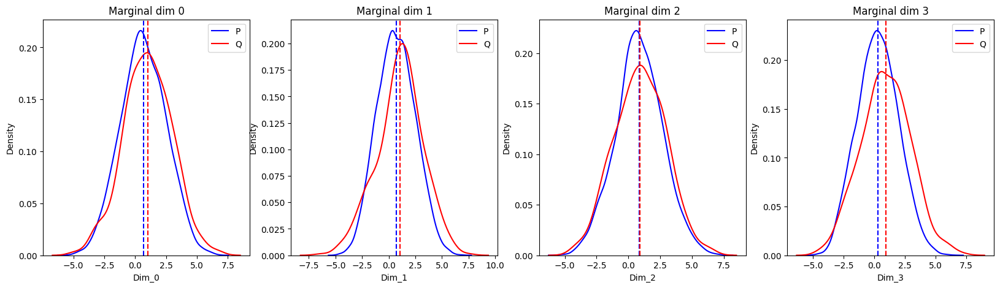

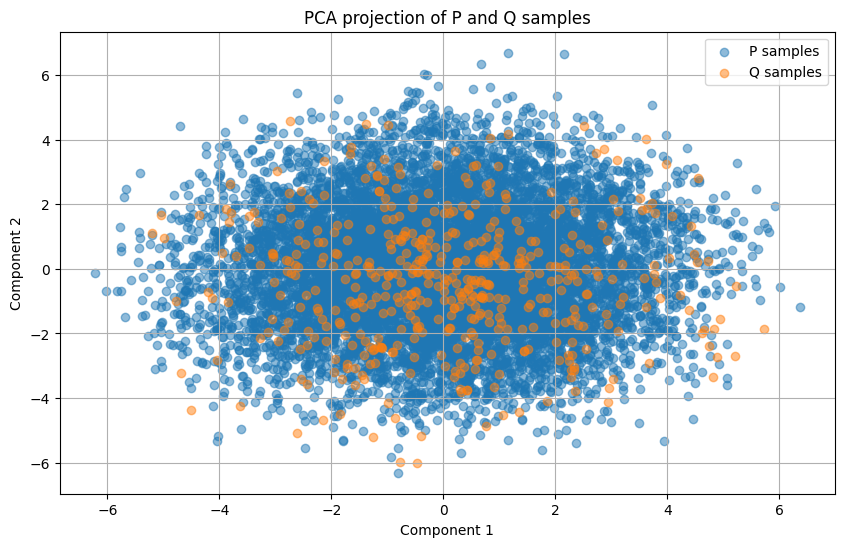

c:\Users\arik_\Documents\Dokumente\Job_Clausthal\PFNs\Repository\PFNExperiments\.conda\lib\site-packages\ot\lp\__init__.py:571: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  check_result(result_code)


In [ ]:
r_hmc = comparison_model_hmc.compare_sample_metrics_batch(test_batch["x"][:5].cpu(), test_batch["y"][:5].cpu())

In [ ]:
vi = Variational_Inference(
    pprogram=pprogram1,
    guide = None,
    n_steps = 2000,
    n_samples=10_000,
    lr = 1e-2
)

....................


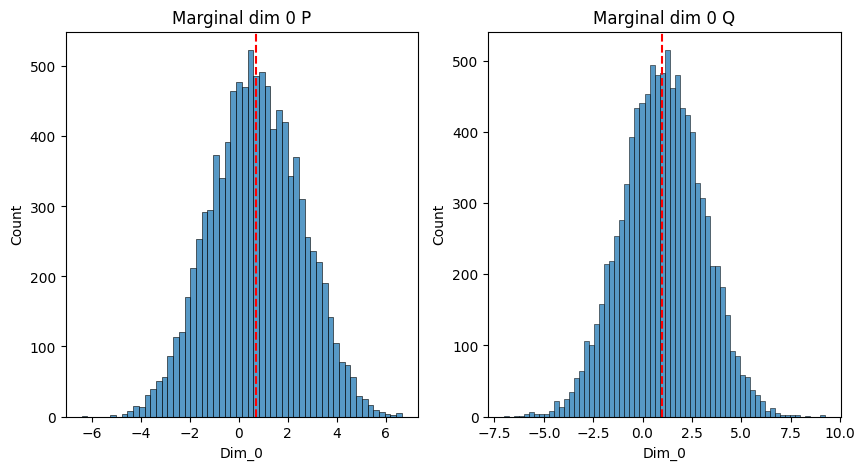

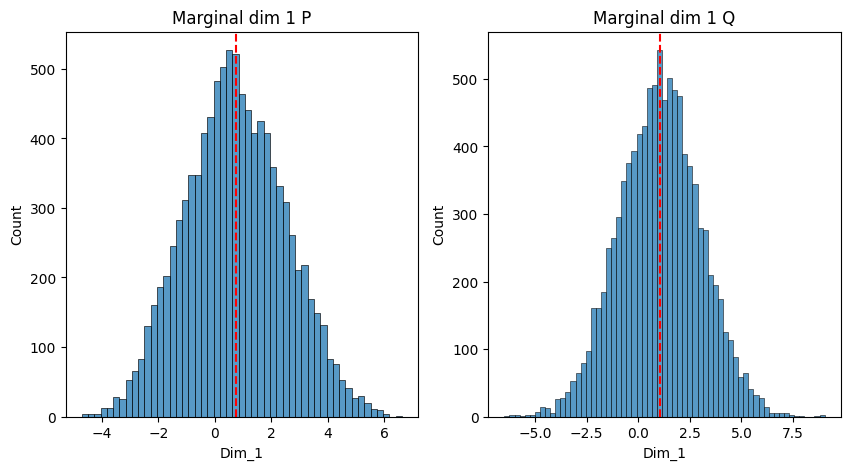

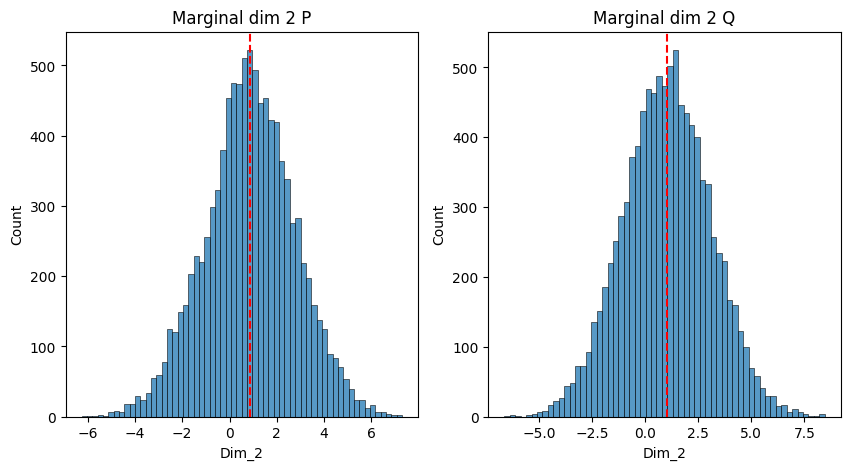

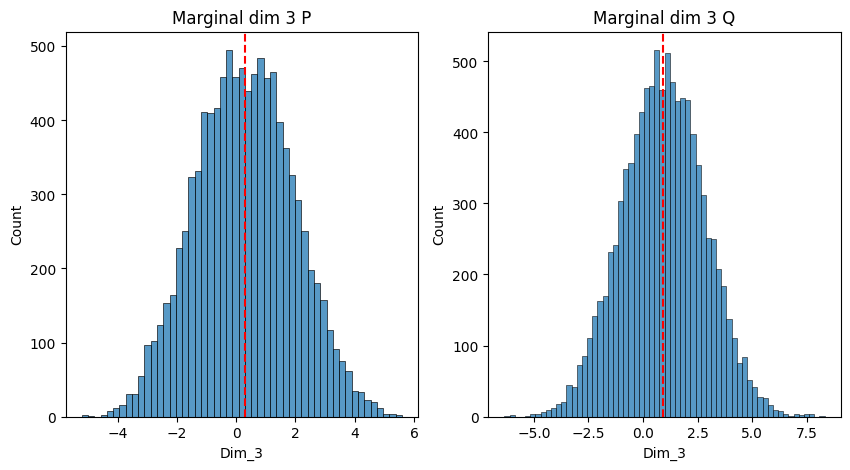

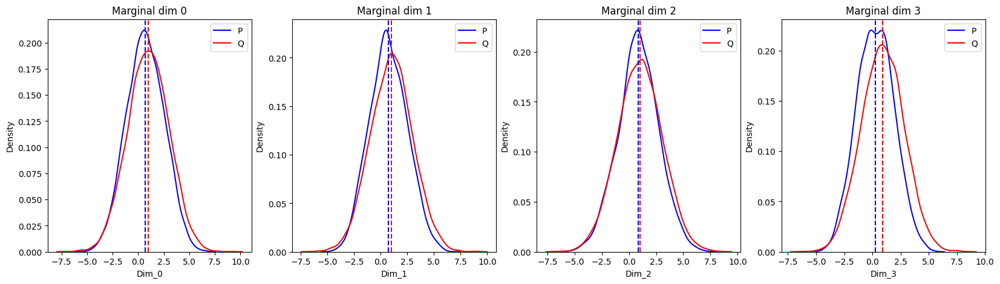

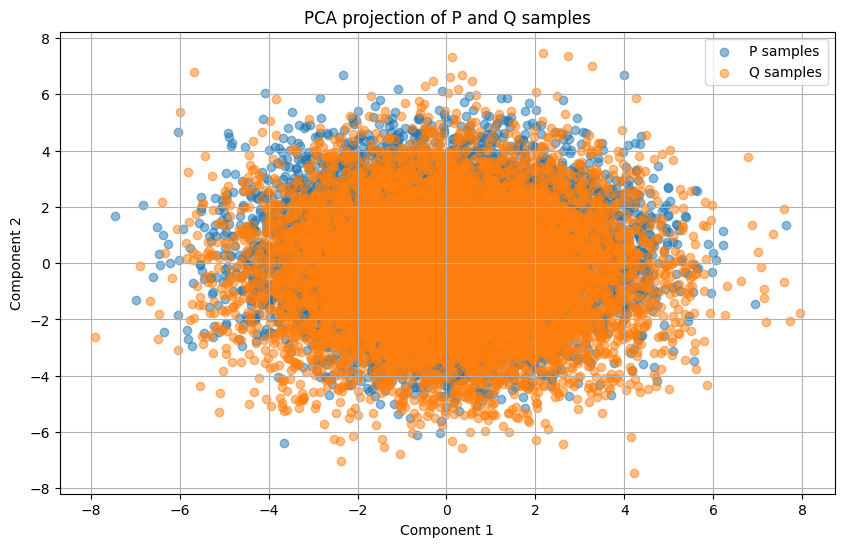

In [ ]:
comparison_model_vi =  CompareComparisonModels(
    comparison_model_1=full_model,
    comparison_model_2=vi,
    n_samples_comparison_model_1=10_000,
    save_path = trainer.save_path
)

r_vi = comparison_model_vi.compare_sample_metrics_batch(test_batch["x"][:5].cpu(), test_batch["y"][:5].cpu())

In [ ]:
print(r_vi)

([{'CST': {'accuracy': 0.851, 'roc_auc_score': 0.851}, 'MMD': 0.382432222366333, 'Wasserstein_distance with metric euclidean': 0.44791263341903687, 'mean_stats': {'absolute_mean_diff': tensor(0.0558), 'squared_mean_diff': tensor(0.0045), 'P_mean': tensor([-1.0746,  0.6922,  0.1665, -0.3666, -0.5925, -0.6509, -0.9716,  1.7523,
        -0.4697, -1.4973]), 'Q_mean': tensor([-0.9776,  0.7030,  0.2077, -0.3230, -0.5999, -0.7305, -0.9898,  1.6816,
        -0.3448, -1.4322])}, 'std_stats': {'absolute_std_diff': tensor(0.0654), 'squared_std_diff': tensor(0.0044), 'P_std': tensor([0.2018, 0.1914, 0.1939, 0.2014, 0.1959, 0.1951, 0.2007, 0.2001, 0.2074,
        0.2023]), 'Q_std': tensor([0.1268, 0.1334, 0.1499, 0.1359, 0.1262, 0.1344, 0.1170, 0.1246, 0.1604,
        0.1269])}, 'q_025_stats': {'absolute_q_025_diff': tensor(0.1429), 'squared_q_025_diff': tensor(0.0250), 'P_q_025': tensor([-1.4545,  0.3094, -0.1885, -0.7536, -0.9733, -1.0300, -1.3322,  1.3717,
        -0.8687, -1.9311]), 'Q_q_025': 

In [ ]:
comparison_model_comparer = CompareComparisonModels(
    comparison_model_1=vi,
    comparison_model_2=hmc_sampler,
    n_samples_comparison_model_1=1000,
    save_path = trainer.save_path
)

.

/usr/local/lib/python3.10/dist-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'beta_var'}
  warnings.warn(


...................


Sample: 100%|██████████| 800/800 [00:55, 14.32it/s, step size=1.86e-01, acc. prob=0.930]


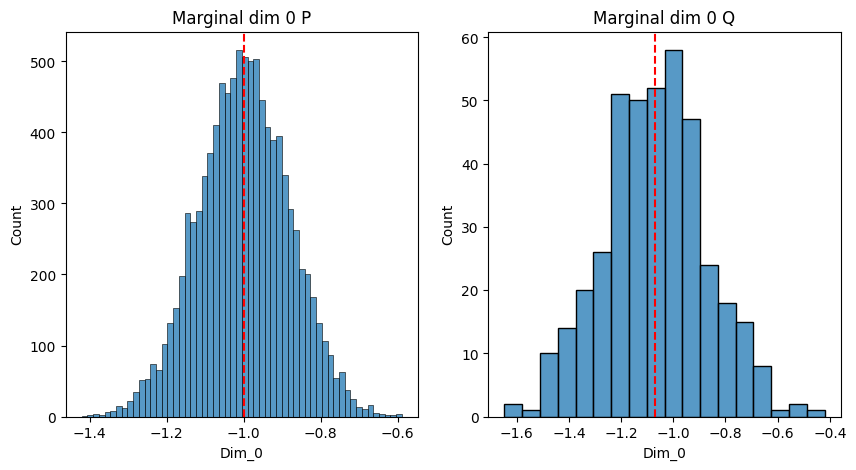

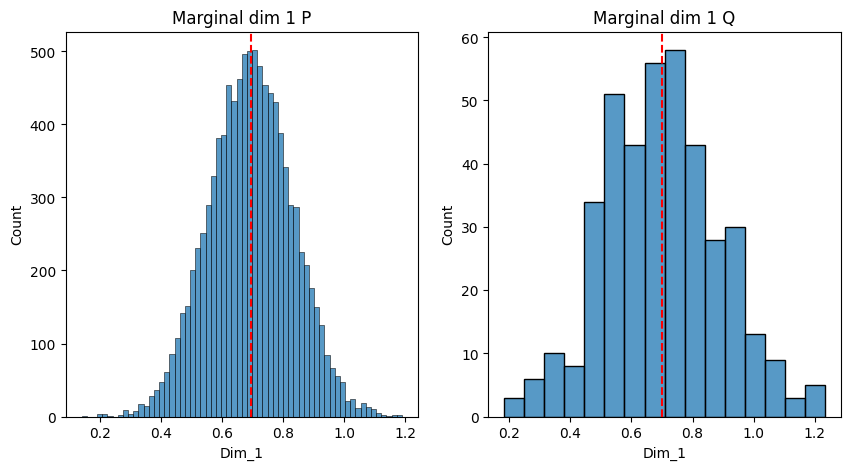

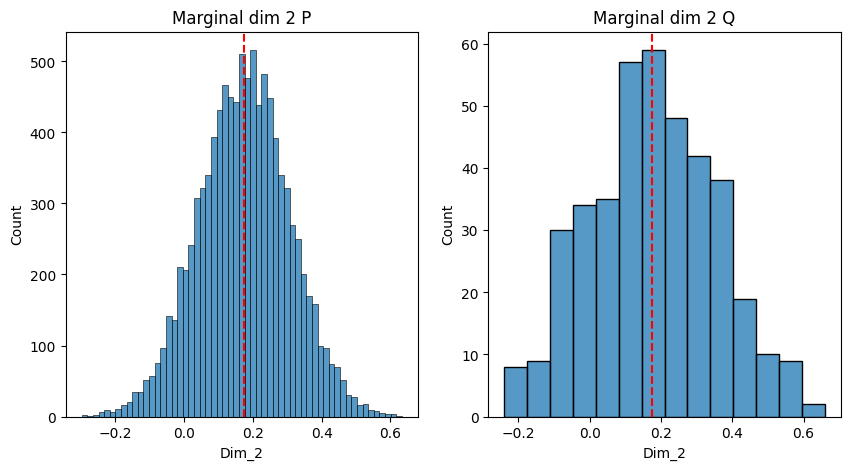

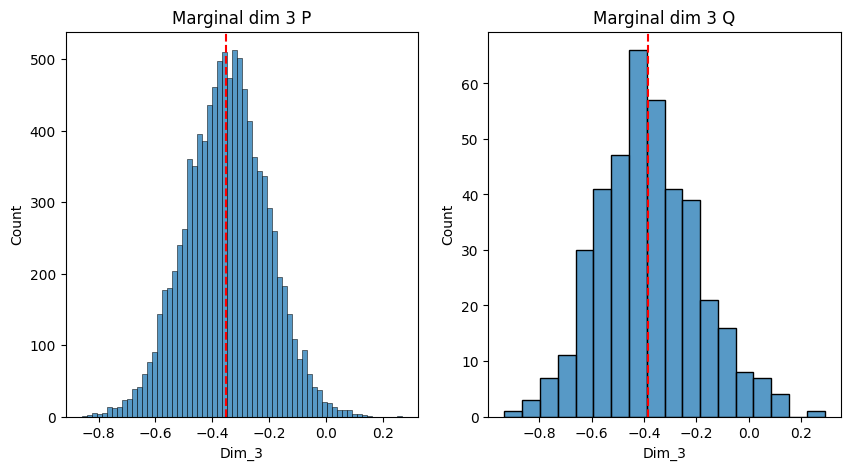

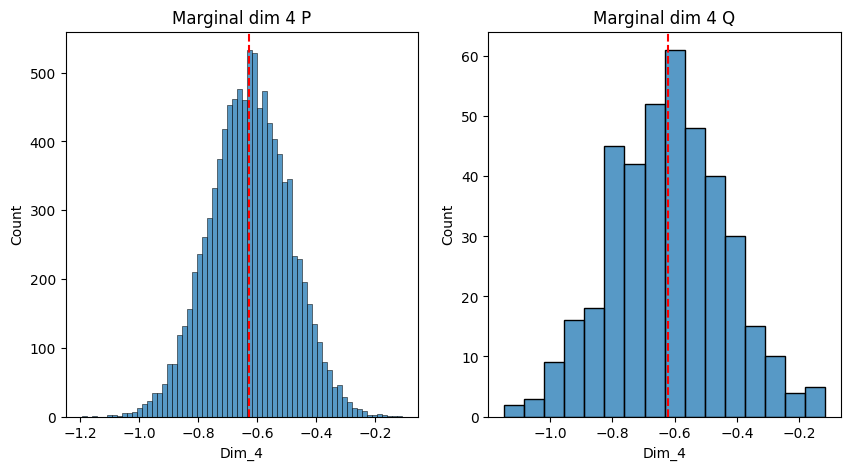

...

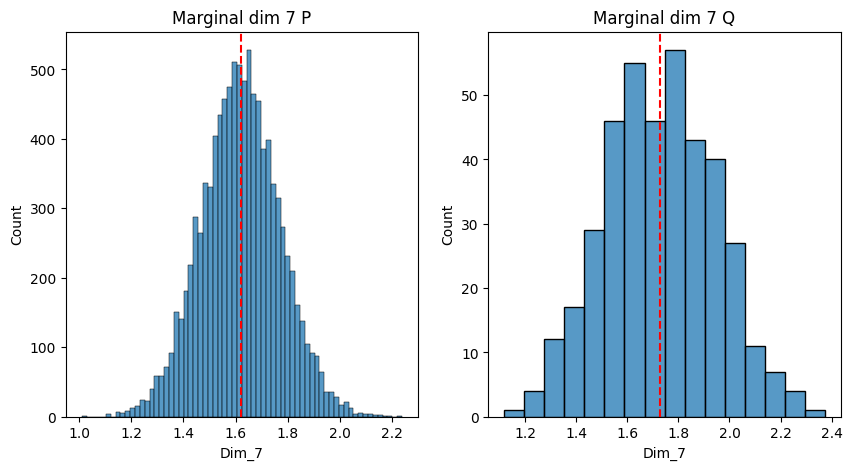

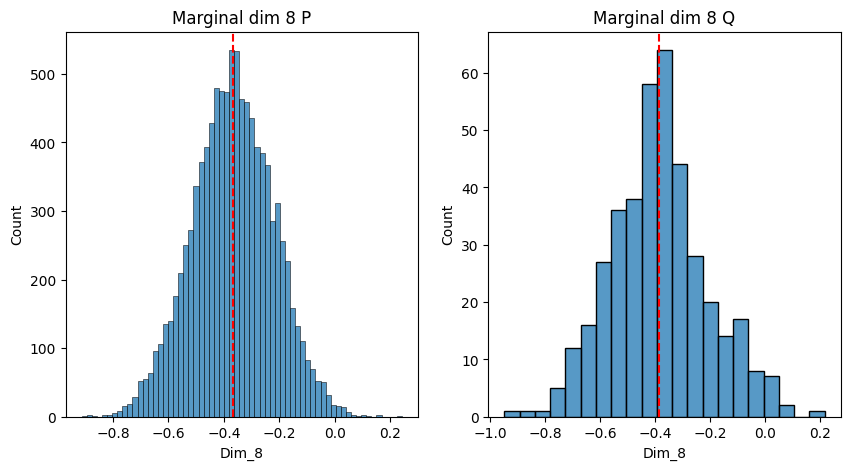

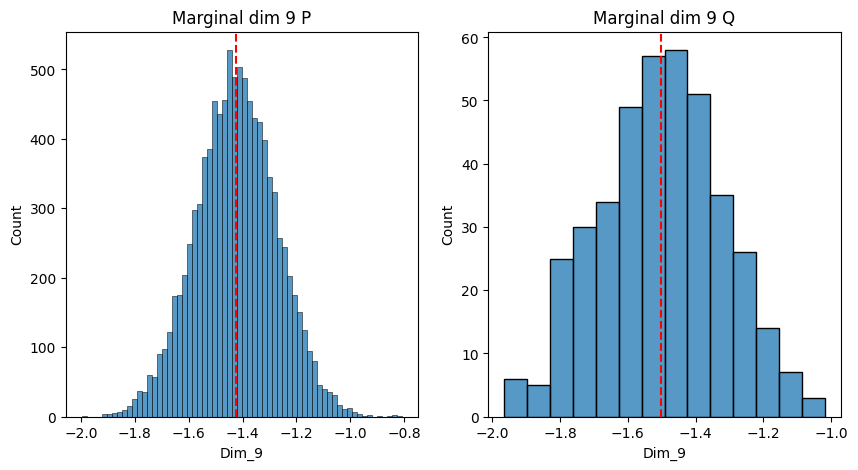

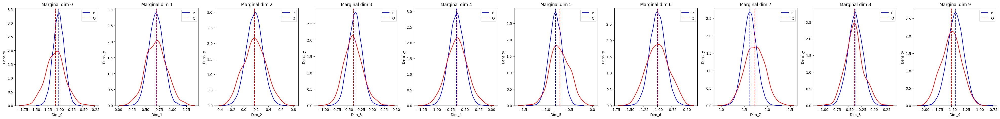

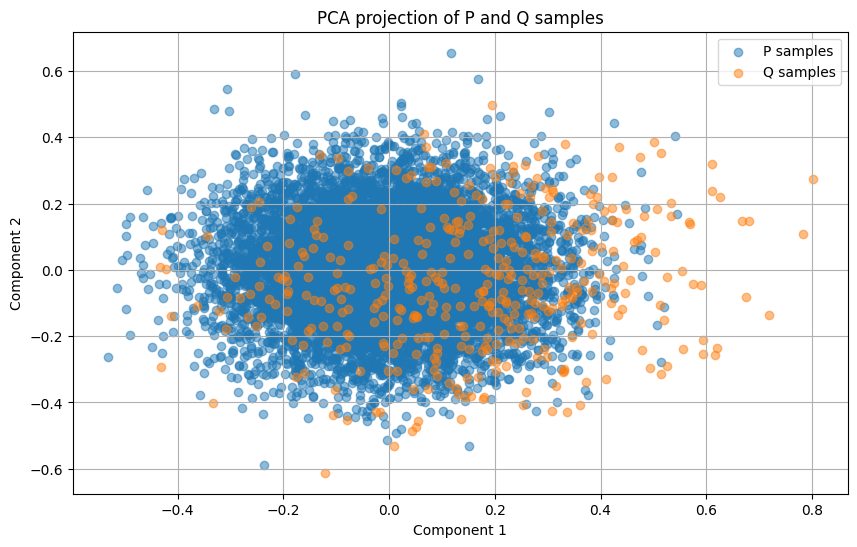

/usr/local/lib/python3.10/dist-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'beta_var'}
  warnings.warn(


....................


Sample: 100%|██████████| 800/800 [00:49, 16.22it/s, step size=2.02e-01, acc. prob=0.926]


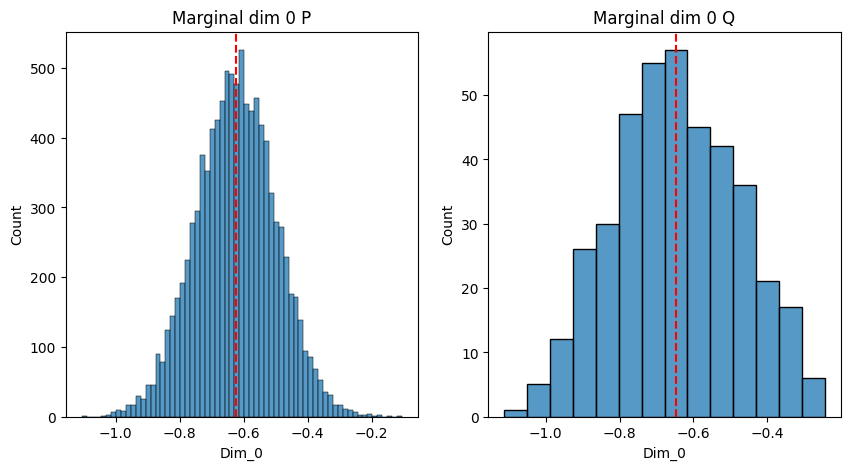

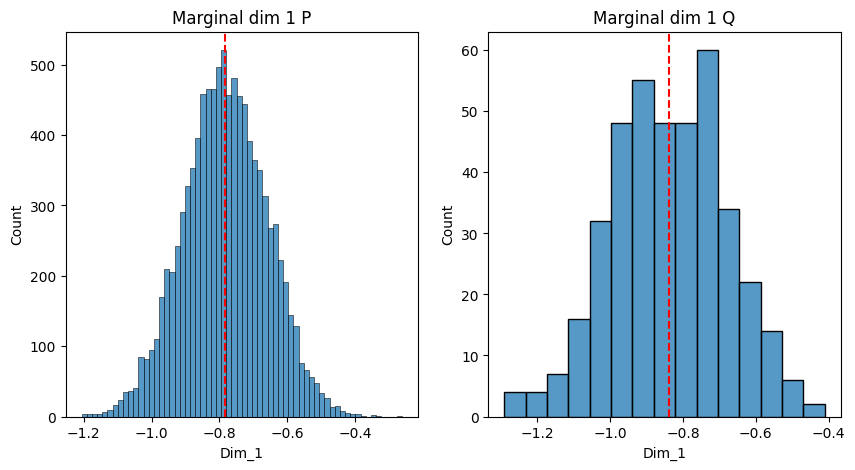

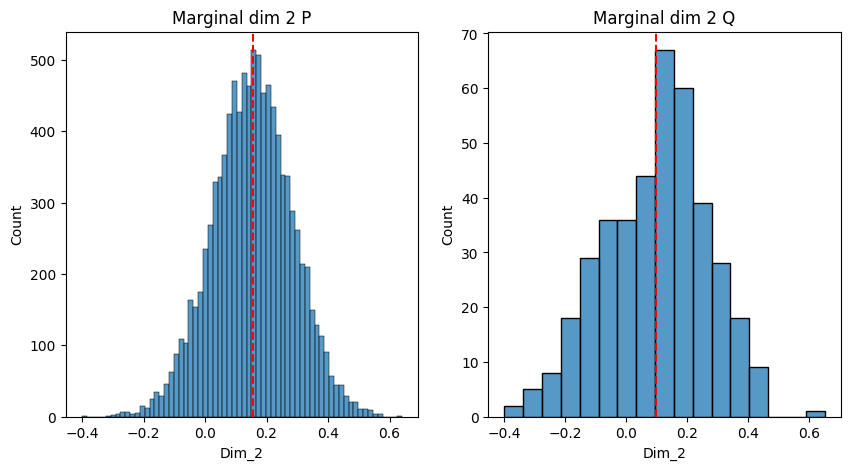

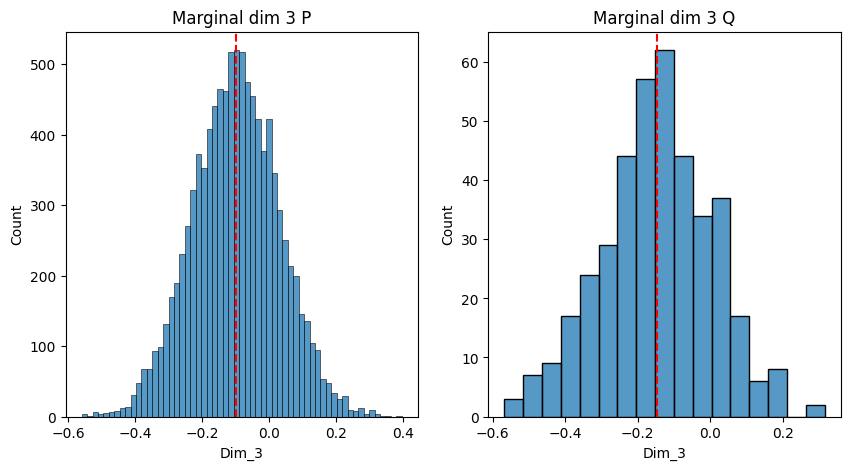

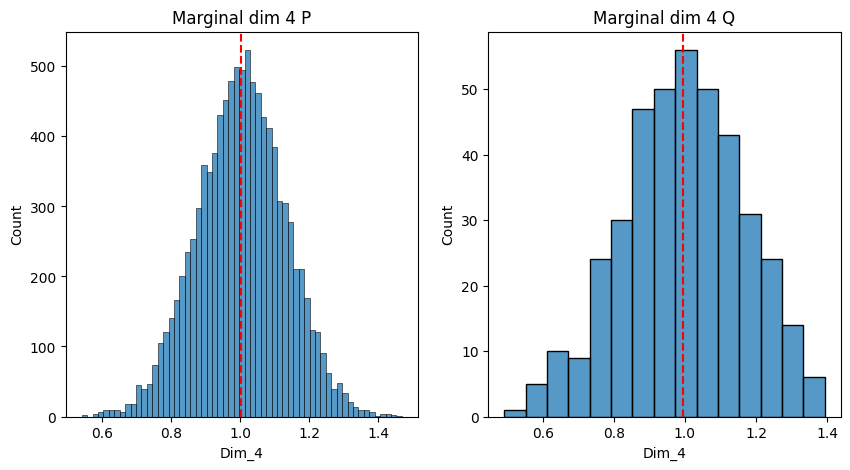

...

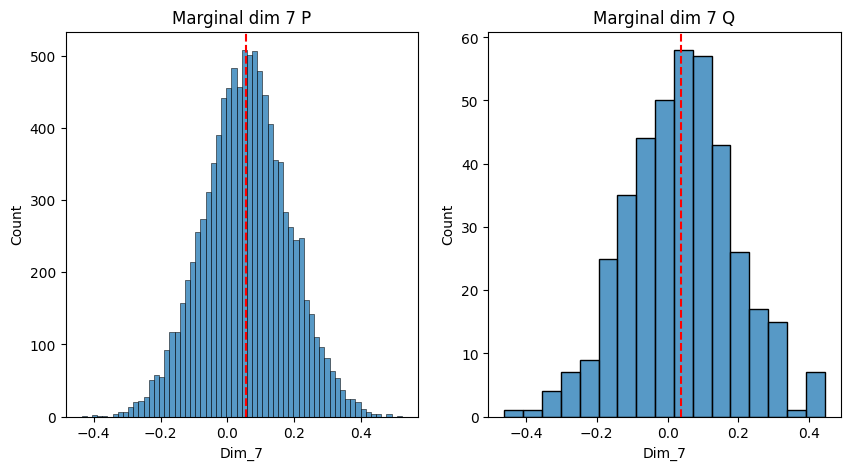

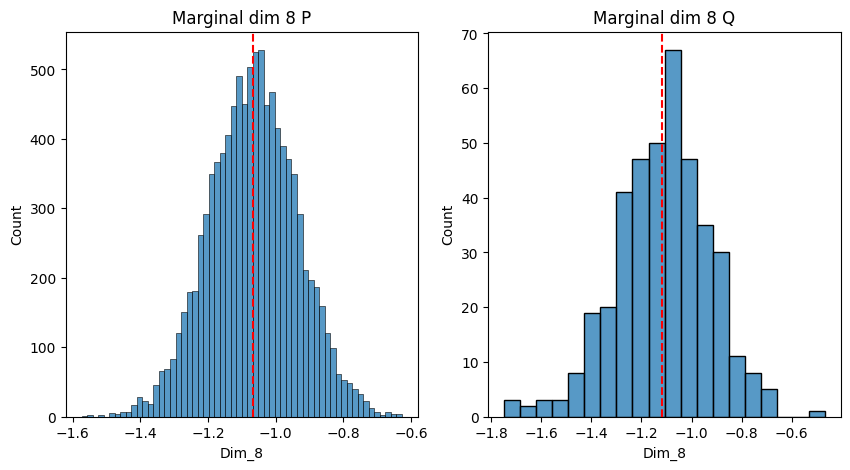

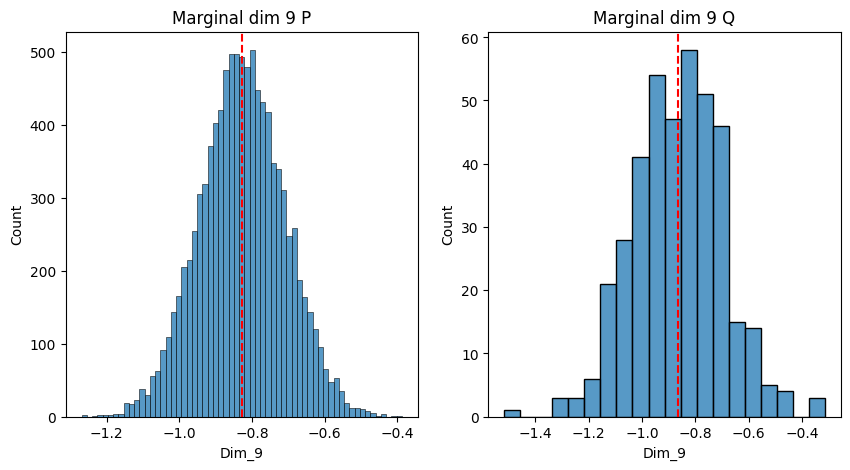

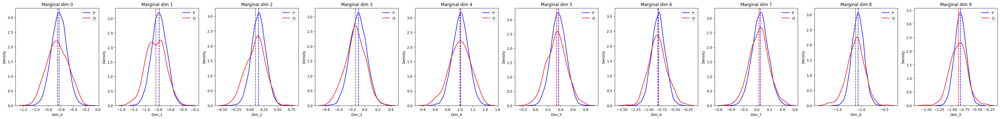

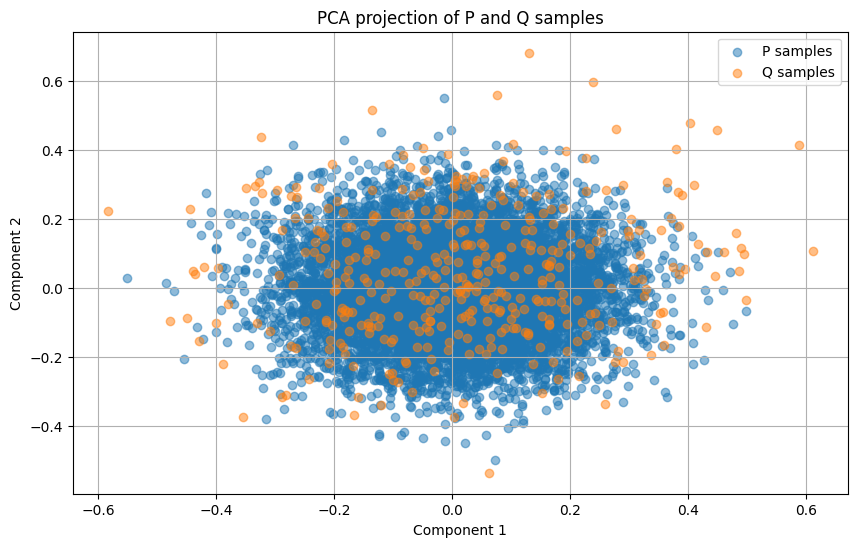

/usr/local/lib/python3.10/dist-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'beta_var'}
  warnings.warn(


....................


Sample: 100%|██████████| 800/800 [00:58, 13.71it/s, step size=1.69e-01, acc. prob=0.944]


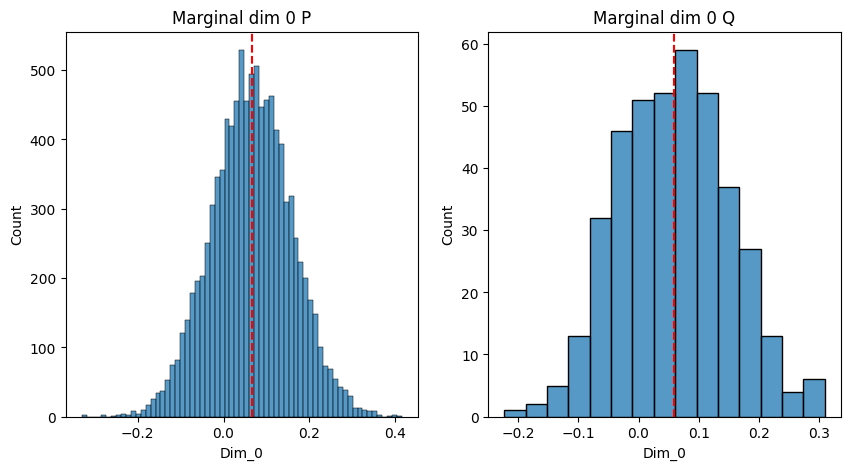

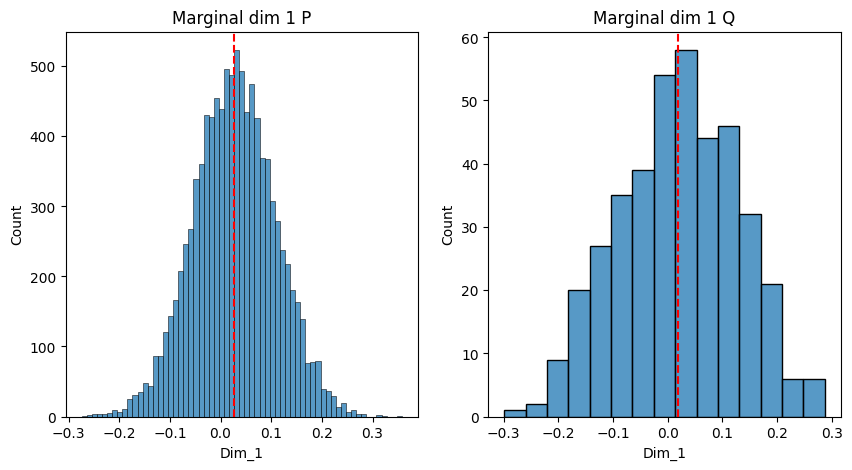

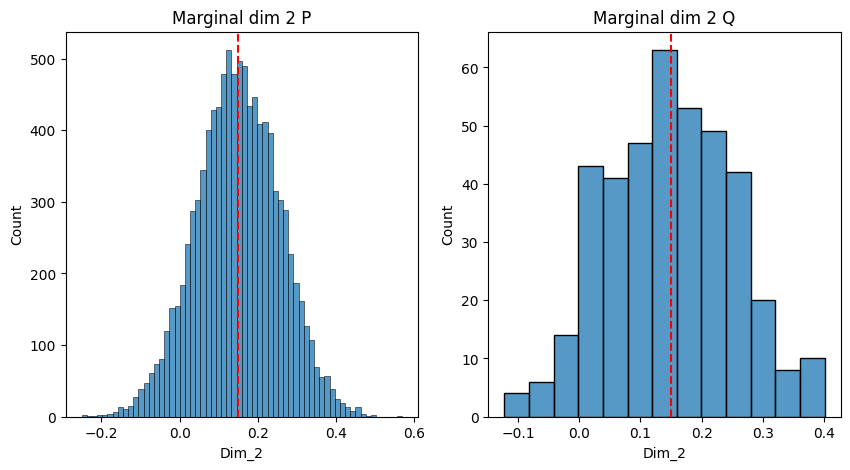

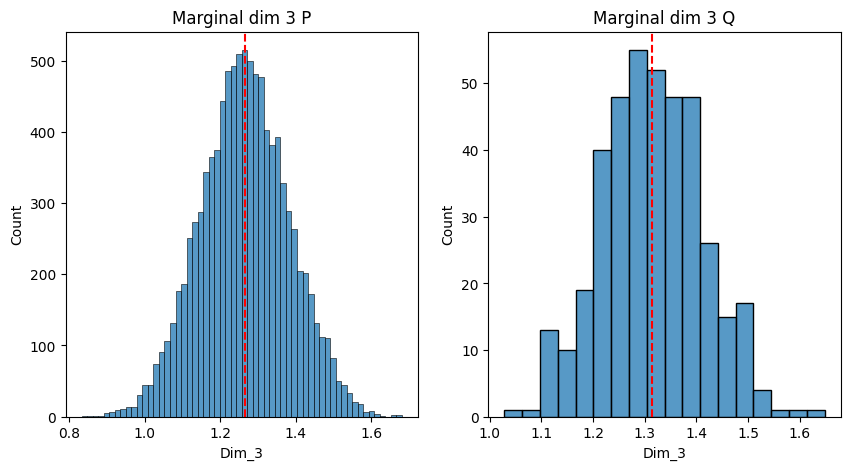

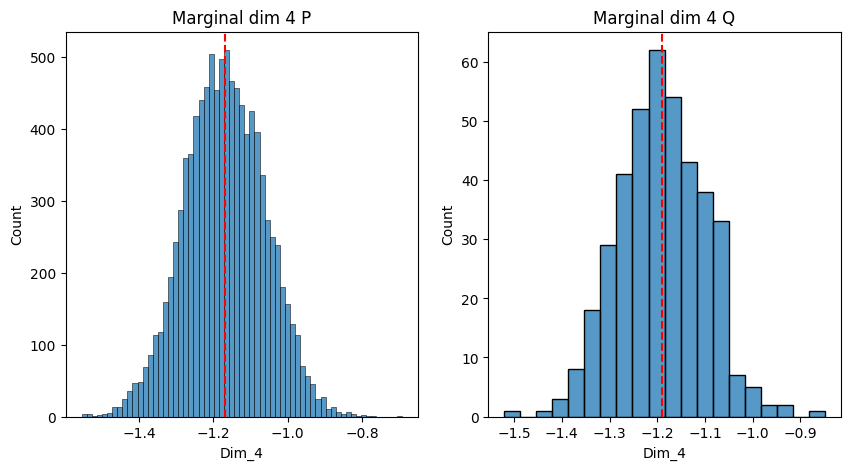

...

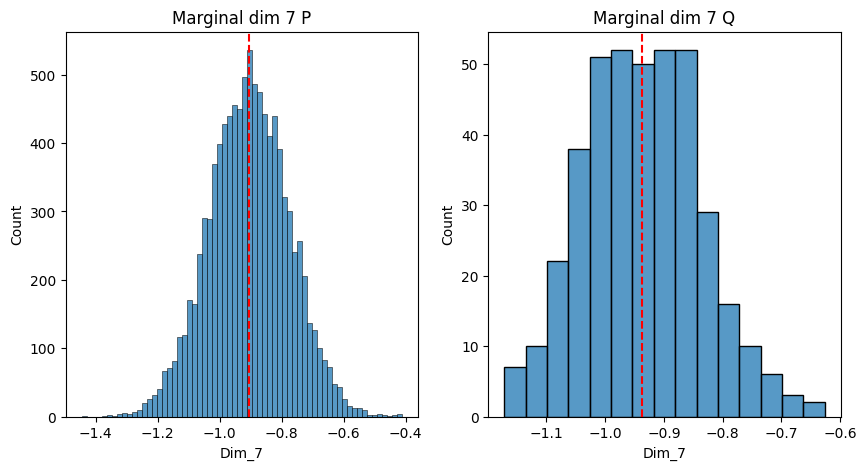

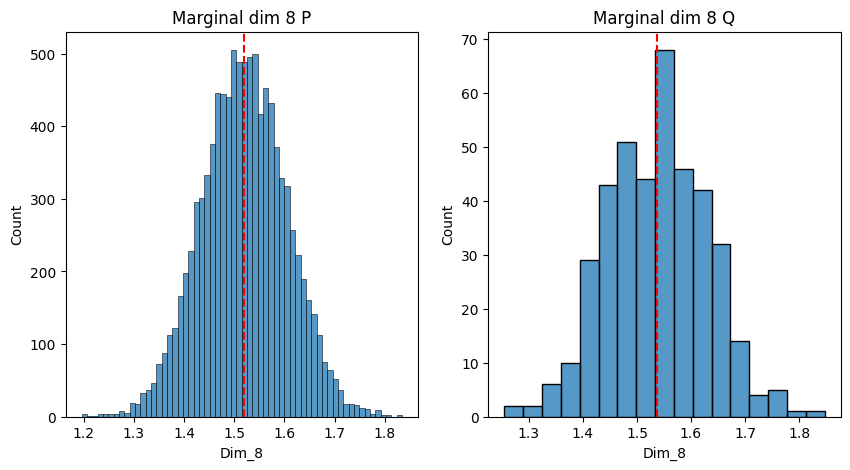

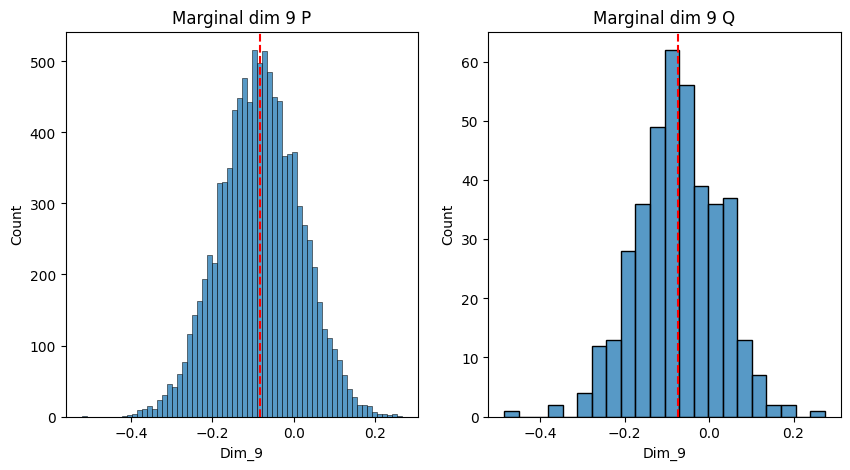

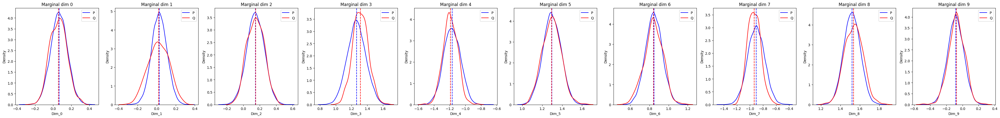

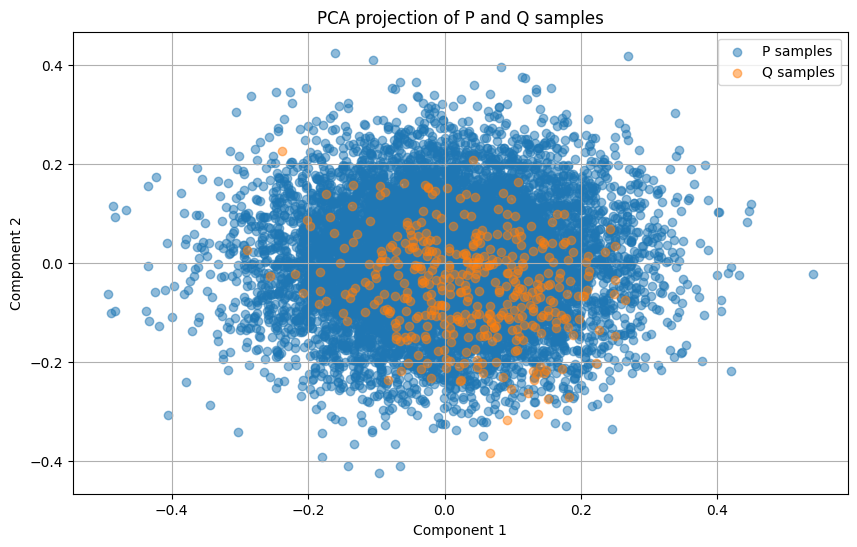

/usr/local/lib/python3.10/dist-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'beta_var'}
  warnings.warn(


....................


Sample: 100%|██████████| 800/800 [00:58, 13.70it/s, step size=1.85e-01, acc. prob=0.934]


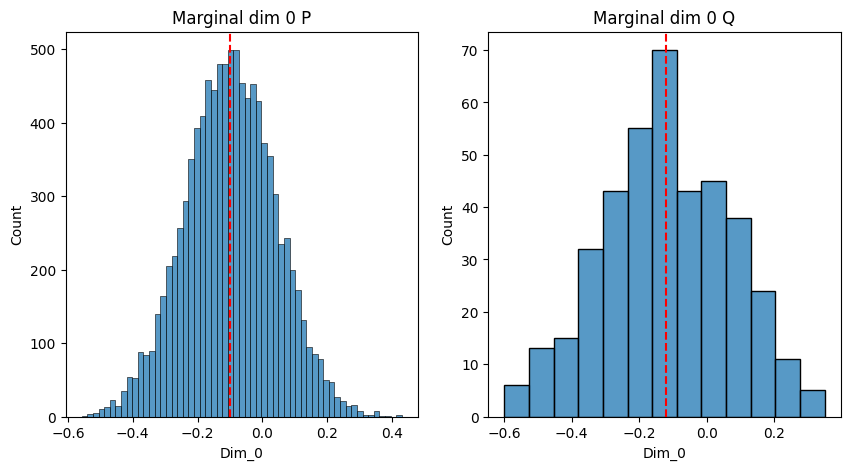

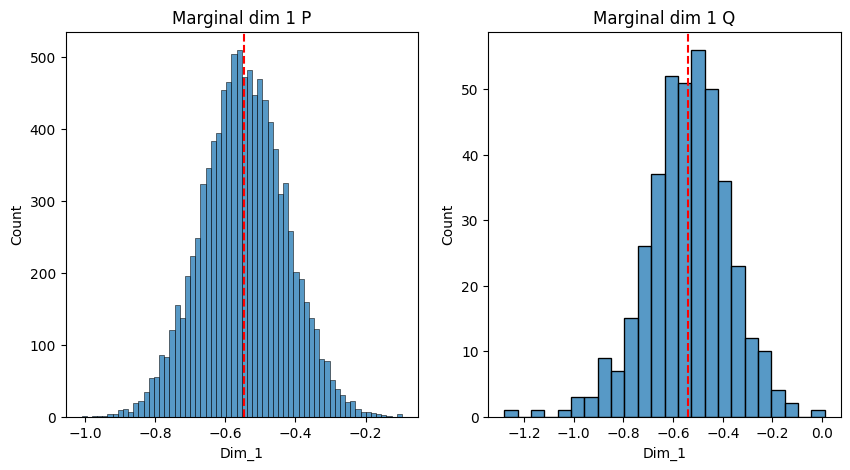

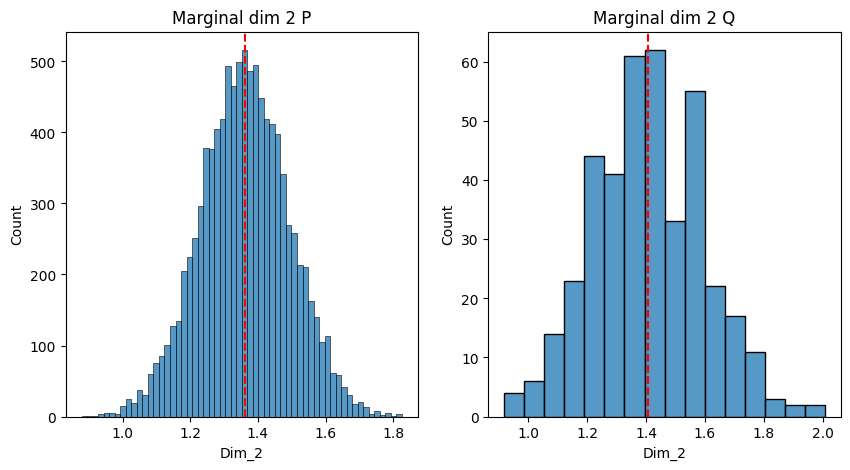

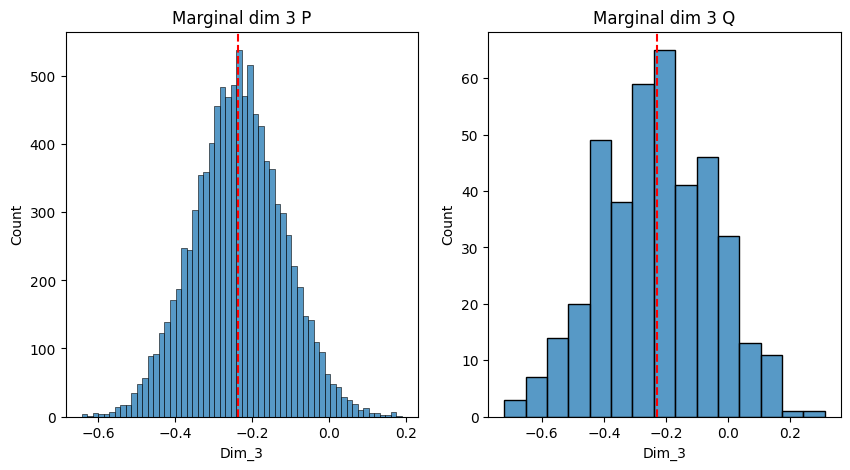

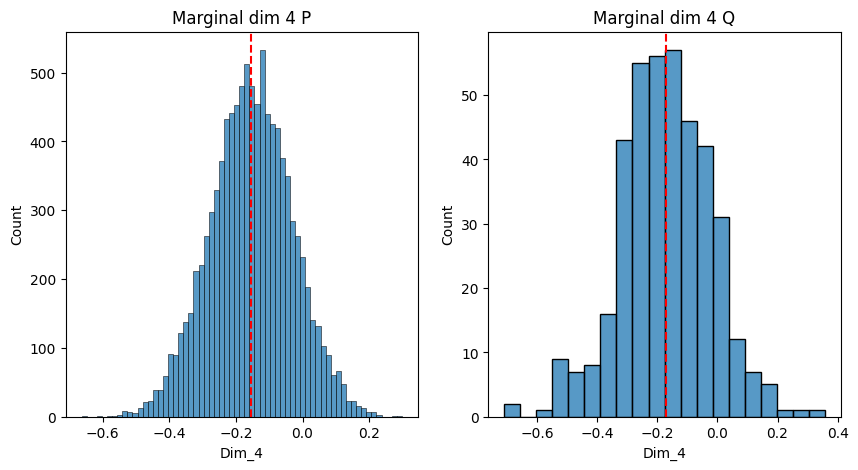

...

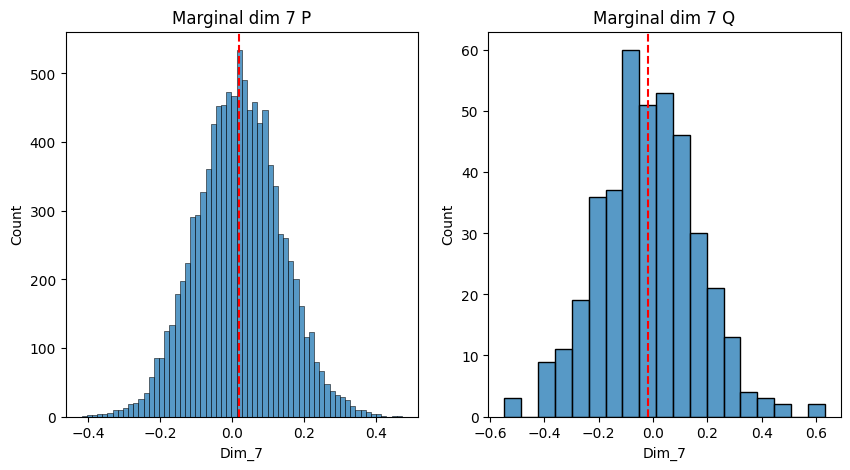

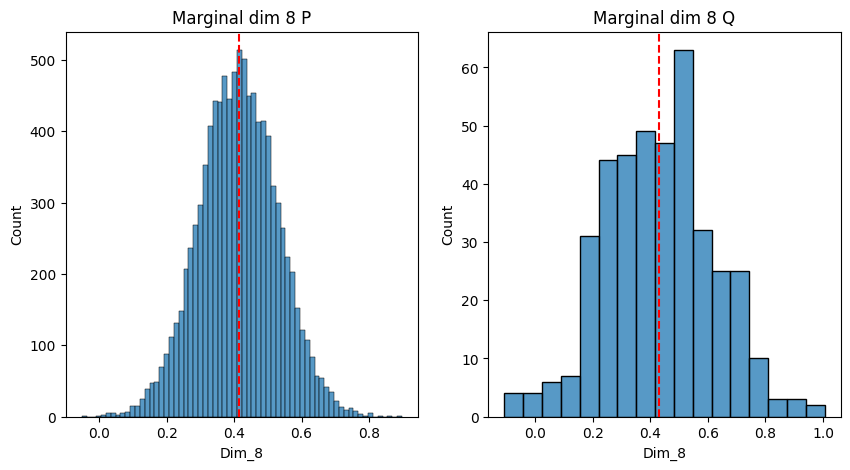

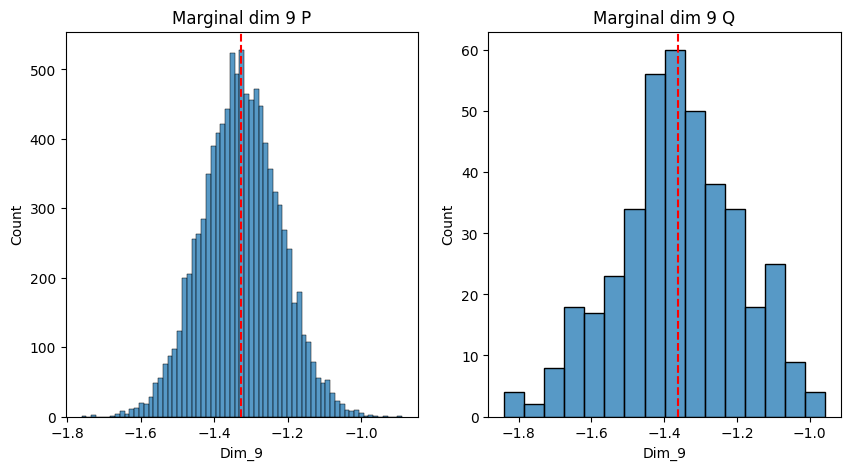

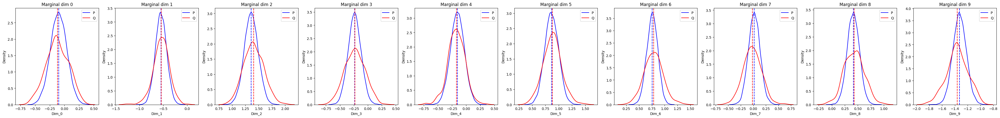

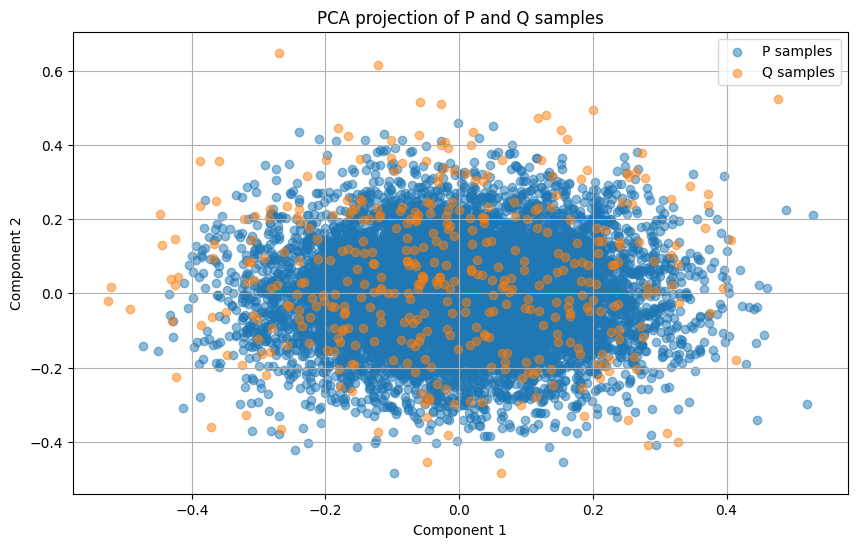

/usr/local/lib/python3.10/dist-packages/pyro/util.py:288: UserWarning: Found non-auxiliary vars in guide but not model, consider marking these infer={'is_auxiliary': True}:
{'beta_var'}
  warnings.warn(


....................


Sample: 100%|██████████| 800/800 [01:02, 12.74it/s, step size=1.65e-01, acc. prob=0.942]


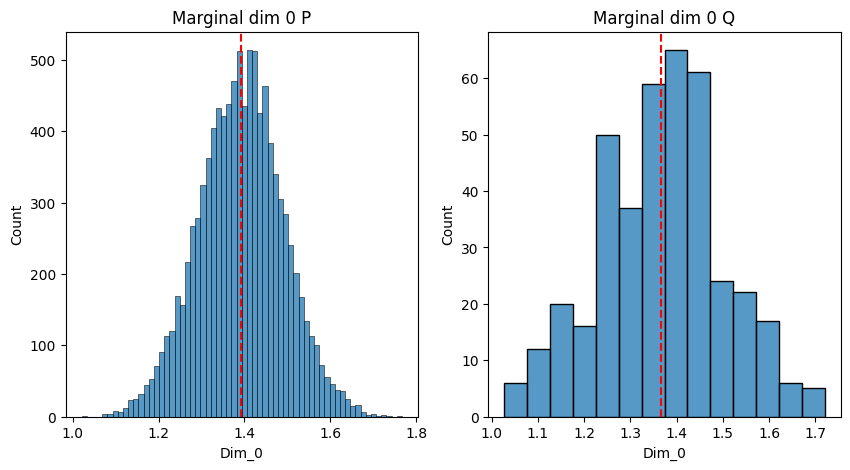

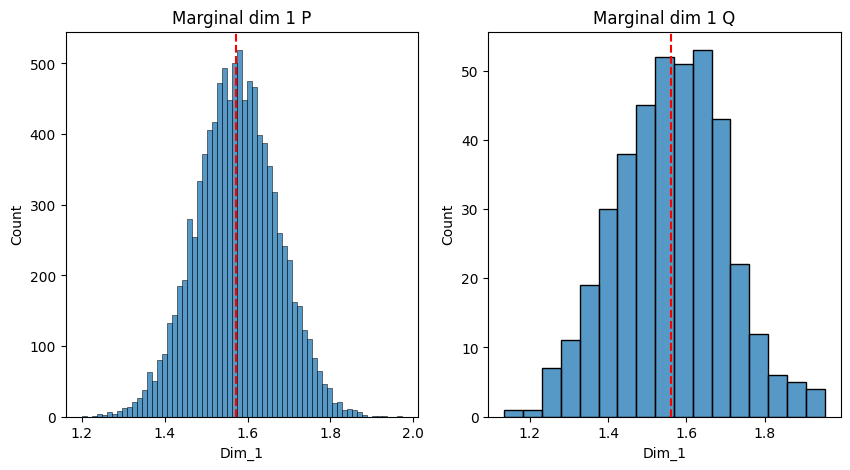

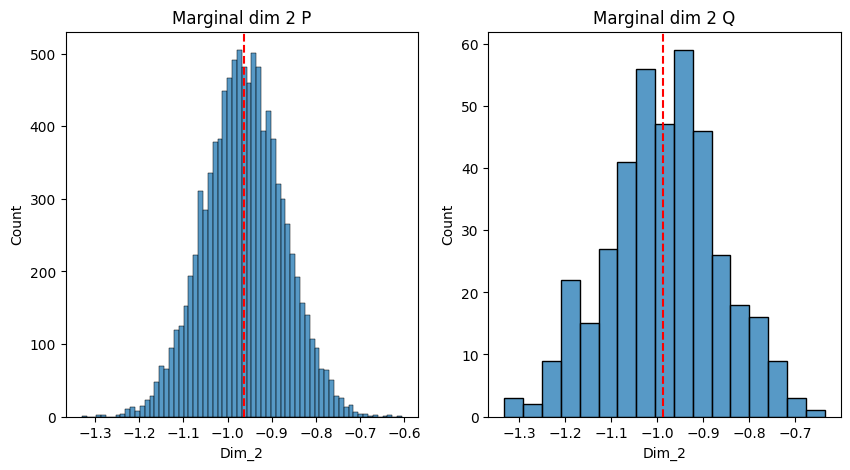

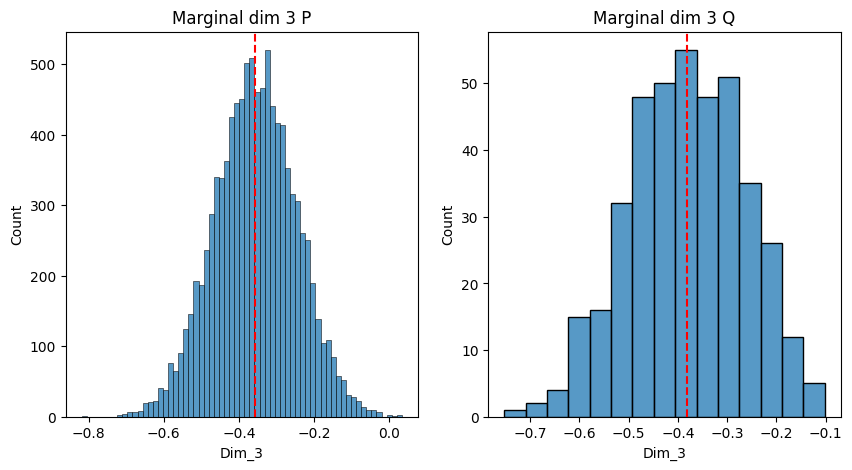

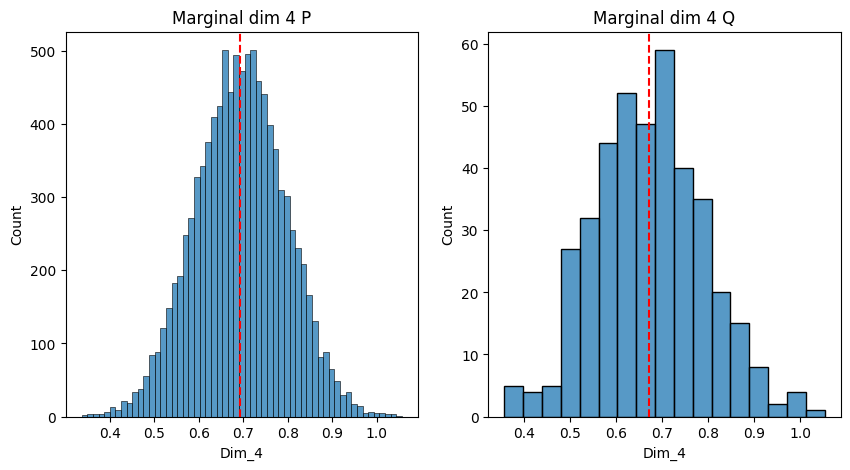

...

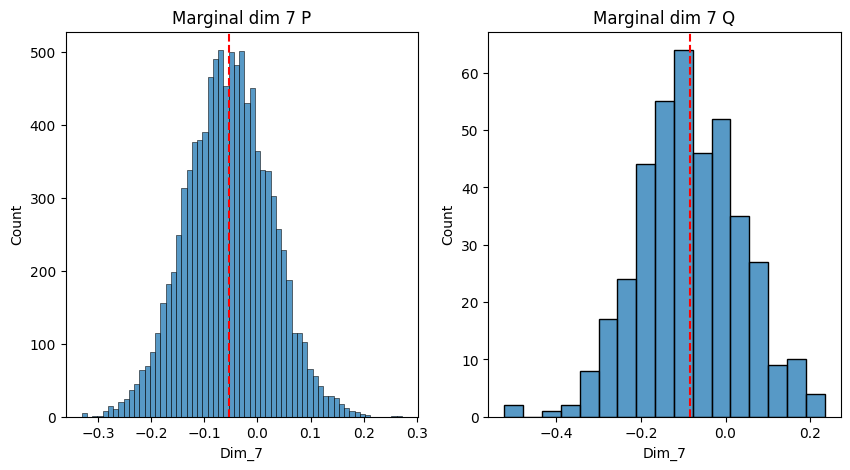

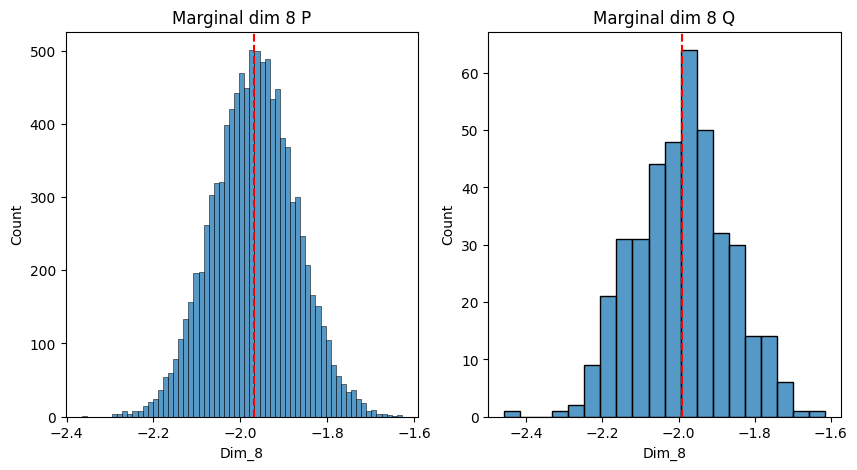

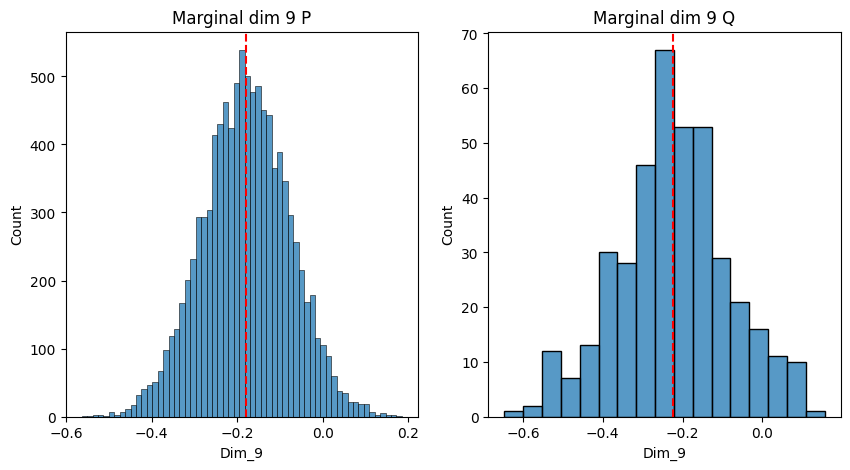

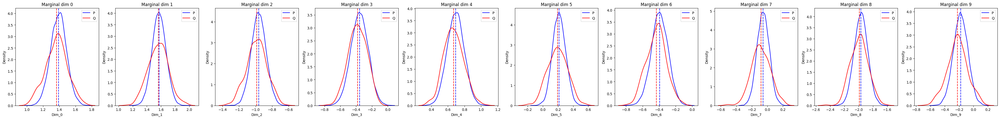

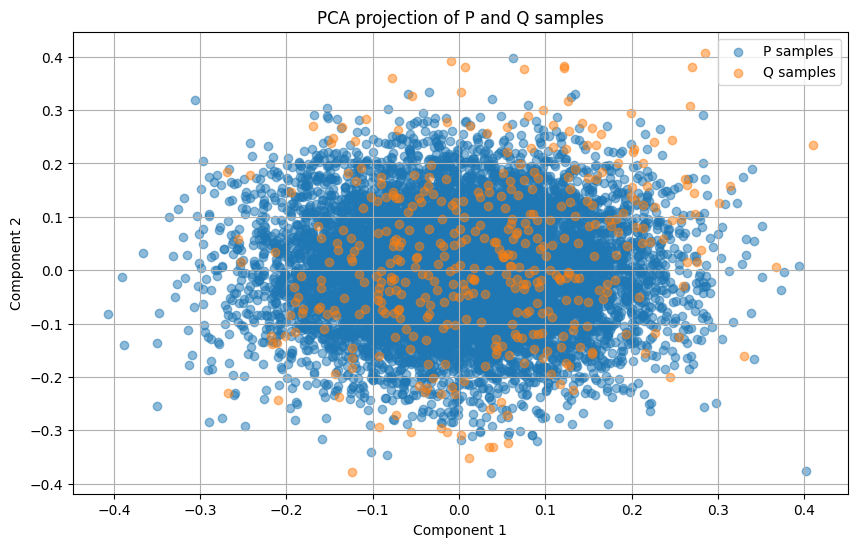

In [ ]:
vi_hmc_res = comparison_model_comparer.compare_sample_metrics_batch(test_batch["x"][:5], test_batch["y"][:5])

In [ ]:
print_wasserstein_distances(vi_hmc_res)

[0.4266628324985504, 0.3555838167667389, 0.22717873752117157, 0.3681538701057434, 0.2735488712787628]
0.33022562563419344
